# Major assignment 2: Audio scaler

In this assignment you will design and implement an audio scaler, also known as a sample rate converter. This scaler will convert an audio stream sampled at CD-rate of 44.1 KHz, to an audio stream with the same audio content sampled DAT-rate of 48 KHz. 

You have to report this assignment according to the guidelines provided in the separate notebook $\mathtt{~guidelines.ipynb}$. To assist you with the task of problem analysis, as mentioned in these guidelines, study the background and an optimization sections below, and perform the tasks and answer the questions in these sections. <b>In general, ensure that you answer all question and complete all tasks mentioned in the cells below!</b>

# Background

A scaler, also known as sample rate converter, is used to convert a signal from one sample rate to another, while changing the information in the signal as little as possible. The scaler may convert a signal to a higher sample rate, in which case we call it an upscaler, or to a lower sample rate, in which case we call it a downscaler.  In this assignment we will be converting from a sample rate of 44.1 kHz (used on audio cds) to 48 kHz (used on digital audio tape), which requires an upscaler.

The main problem of scaling is that we have to construct samples at positions for which there is no data available in the original signal. This is illustrated in Figure 1 for input signal $x[n]$ and output signal $y[k]$. To solve this, we need a scheme to determine a value in between 2 adjacent input samples.

<br>
<figure>
  <img src="../images/interpolation.svg" alt="Drawing" style="width: 800px;">
<figcaption><center>Fig 1. The input signal x[n] has lower sampling frequency than output signal y[k], so interpolation is necessary.</center>
</figcaption>
</figure>

Assume that the input sample rate is $F_x$ and the output sample rate is $F_y$. If the following relation holds $\frac{F_y}{F_x} = \frac{L}{M}$, for some integers $L$ and $M$, then this problem can be solved in 2 steps: first convert the input signal to an intermediate signal with sample rate $F_xL$ and then convert that signal to a signal that has sample rate $\frac{F_xL}{M} = F_y$. That leaves us with 2 simpler problems to solve.

First, we need to generate the intermediate signal from the input. Increasing the sample rate to $F_xL$ is done using an upsampler, that introduces $L{-}1$ zeroes in between each pair of consecutive input samples.  However, this will introduce a lot of high frequency noise outside of the frequency range that can be represented in the input signal. So we need to low-pass filter the resulting signal to only pass the frequencies that are representable in the input.

Second, we need to generate the output signal from the intermediate signal. Decreasing the sample rate to $\frac{F_xL}{M}$ is done by a downsampler, that discards $M{-}1$ input samples for every output sample. However, if the intermediate signal contains frequencies that cannot be represented in the output, we have to low-pass filter the intermediate signal first.

To build the the $\frac{L}{M}$ scaler, we connect the above 2 systems in series, resulting in a series connection of 4 components: an upsampler, 2 low-pass filters, and a downsampler. The 2 low-pass filters can be combined into 1 low-pass filter: simply take the one that has the lowest cut-off frequency, i.e. the one that removes the largest number of frequencies. The block diagram of this system is illustrated in Figure 2, 

<br>
<figure>
  <img src="../images/scaler.svg" alt="Drawing" style="width: 600px;">
<figcaption><center>Fig 2. A $\frac{L}{M}$ scaler with input stream $x[n]$ and output stream $y[n]$.</center>
</figcaption>
</figure>

and its behavior in Figure 3.

<br>
<figure>
  <img src="../images/lollipop-diagram.svg" alt="Drawing" style="width: 600px;">
<figcaption><center>Fig 3. Behavior of a $\frac{5}{4}$ scaler on an input stream $x[n]$.</center>
</figcaption>
</figure>

The requirements for the combined low-pass filter are that all frequencies above $\frac{F_x}{2}{\downarrow}\frac{F_y}{2}$ Hz (the maximum frequency that is representable in both the input and output stream) should be removed, and all frequencies below it should be passed. This ideal behaviour can only be obtained using a $\text{sinc}$ function to generate the filter coefficients. The definition of the $\text{sinc}$ function is:

$$
\begin{align}
\text{sinc}(t) =
\left\{
\begin{array}{ll}
1                         & t = 0 \\
\frac{\sin(\pi t)}{\pi t} & t \neq 0 \\
\end{array}
\right.
\end{align}
$$

For the upscaler, the coefficients for the filter are $\text{sinc}(\frac{n}{L})$ for $n \in \mathbb{Z}$. Because the sinc function goes to zero only in its limits, we get an infinite amount of non-zero coefficients. It is impossible to implement such a filter, so what is used in practice is a windowed sinc function, which is only non-zero for a finite length interval. The lanczos2 function is an example of a windowed sinc function (see also Figure 4:

$$
\begin{align}
\text{lanczos2}(t) =
\left\{
\begin{array}{ll}
0 & t \leq -2 \\
\text{sinc}(t)\text{sinc}(\frac{t}{2}) & -2 < t < 2 \\
0 & t \geq 2 \\
\end{array}
\right.
\end{align}
$$

Using the lanczos2 function, the coefficients for the upscaler's low-pass filter become $\text{lanczos2}(\frac{n}{L})$ for $n \in \mathbb{Z}$.  Because the lanczos2 function is non-zero only at the interval $(-2, 2)$, we only need $4L$ filter coefficients, and the desired filter is therefore implementable by a simple FIR-filter. 

<br>
<figure>
  <center>
  <table  CELLSPACING="100px"> <tr>
  <td><img src="../images/sinc.png" alt="Drawing" style="width: 350px;"></td>
  <td><img src="../images/lanczos2.png" alt="Drawing" style="width: 350px;"></td>
  </tr></table>
  </center>
<figcaption><center>Fig4. The sinc function (left) and the lanczos2 function (right).</center>
</figcaption>
</figure>


The sum of the coefficients of the low-pass FIR filter should always add up to 1. This is easy to see if we a apply a signal of constant value (a DC signal). This signal can be seen as having an infinitesimal frequency, so should be passed undistorted. According to the FIR filter equation, the only way to get this input signal back is by letting the coefficients sum to 1. If the coefficients are generated using the sinc function, this property holds. However, if the lanczos2 function is used, it doesn't hold. This means that for the lanczos2 function an additional normalization step is requires to force the coefficients to sum up to 1.

However, if we look at the average intensity of the upsampled signal, it is only $\frac{1}{L}$ times that of the input signal. So to get the input signal intensity back, we have to multiply the normalized coefficients by $L$, effectively letting them sum to $L$.

---

At the start of this assignment, all the libraries needed are imported here.

In [1]:
import math
import numpy as np

from matplotlib import pyplot as plt
from collections.abc import Iterable
from StaccatoLab import *

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
version()

'StaccatoLab: version alpha.11'

In the next block, we define an auxiliary function for later visualization use.

In [2]:
def plot_function(scope, t, fig_size, func):
    fig = plt.figure(figsize=fig_size)
    ax = fig.add_subplot(111)
    ax.plot(t, func(t))
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('data', 0))
    ax.yaxis.set_ticks_position('left')
    ax.spines['left'].set_position(('data', 0))
    plt.title(str(func).split(' ')[1])
    plt.show()

## Task 1

- Define a Python function that computes *lanczos2*.
- Using matplotlib, plot the function on the interval [-3, 3] (The result should match Figure 4).
- Use your function to generate, for $L = 15, 64,$ and $160$, the coefficients of a low-pass FIR-filter with $4L$ coefficients based on the  lanczos2 function. 

<center><font color=blue size="5">
Insert the code that implements Task 1 here.
</font></center>

First, we specify the `sinc(t)` function to facilitate the implementation of `lanczos2`.

In [3]:
def sinc(t):
    if isinstance(t, Iterable):
        length = len(t)
        res = np.empty((length))
        for i in range(length):
            if t[i] == 0:
                res[i] = 1
            else:
                res[i] = np.sin(np.pi*t[i])/(np.pi*t[i])
        return res
    else:
        res = 0.0
        if t == 0:
            res = 1
        else:
            res = np.sin(np.pi*t)/(np.pi*t)
        return res

Next, `lanczos2` is specified as follows.

In [4]:
def lanczos2(t):
    length = len(t)
    res = np.empty((length))
    for i in range(length):
        if np.abs(t[i]) >= 2:
            res[i] = 0
        else:
            res[i] = sinc(t[i])*sinc(t[i]/2)
    return res

As required, we utilize `matplotlib` to depict the function in range $[-3, 3]$. Clearly, the results match the Figure 4 above.

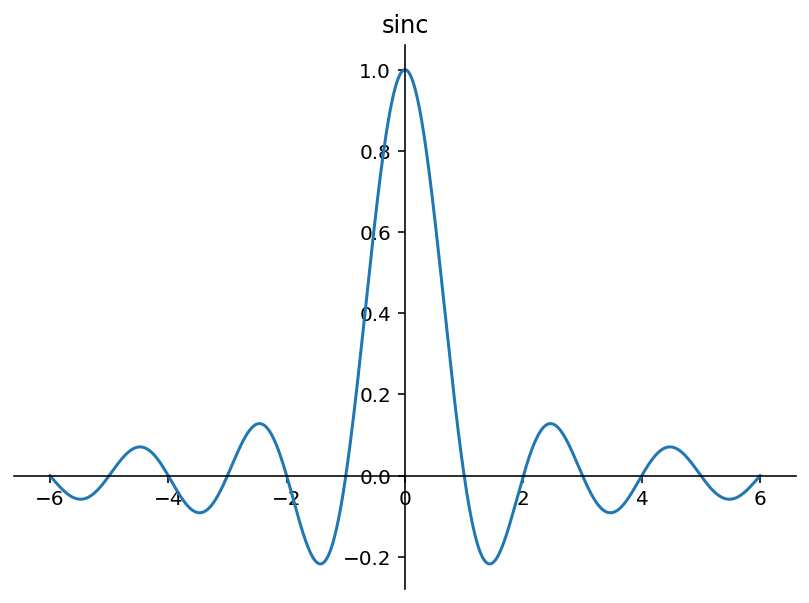

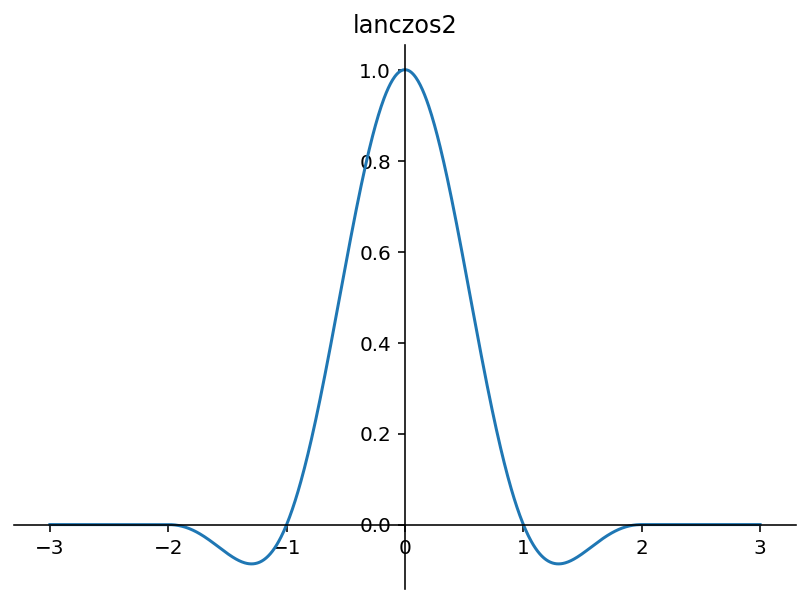

In [5]:
scope = 6
plot_function(scope, np.linspace(0-scope, scope, 1000), (7, 5), sinc)

scope = 3
plot_function(scope, np.linspace(0-scope, scope, 1000), (7, 5), lanczos2)

For the last sub-task, we first specify two auxiliary functions. `plot_coef` is used to visualize the filter coefficients, and `get_coef` can generate and normalize the coefficients to make the sum of them equal to $L$. 

In [6]:
def plot_coef(coef):
    plt.figure(figsize=(24, 8))
    plt.xlabel('index', fontsize=16)
    plt.ylabel('coef', fontsize=16)
    plt.plot(coef, 'bo')
    plt.title("L=%d, num of coef=%d, sum of coef=%.2f" % (int(len(coef)/4), len(coef), sum(coef)))
    plt.stem(coef, use_line_collection=True)

In [7]:
def get_coef(L):
    raw_coef = lanczos2(np.linspace(-2, 2, 4*L))
    coef = raw_coef/sum(raw_coef)*L
    return coef

Now we can generate, visualize and check the coefficients for $L=15$, $64$, and $160$. We can observe that the sum of the coefficients are indeed equal to $L$ as required. These coefficients will be used later.

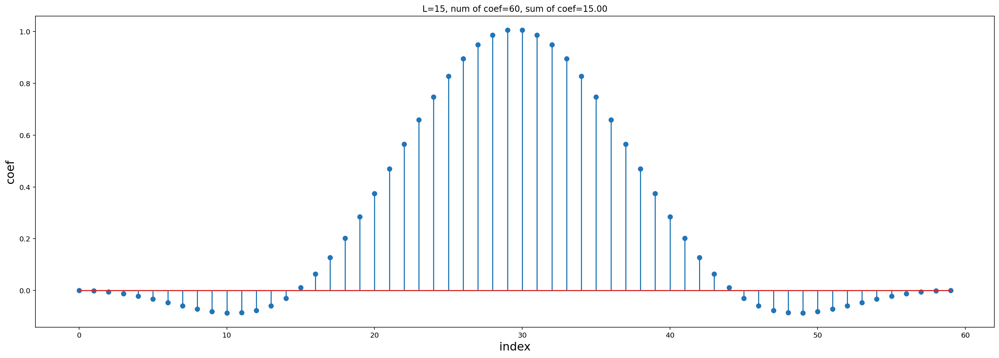

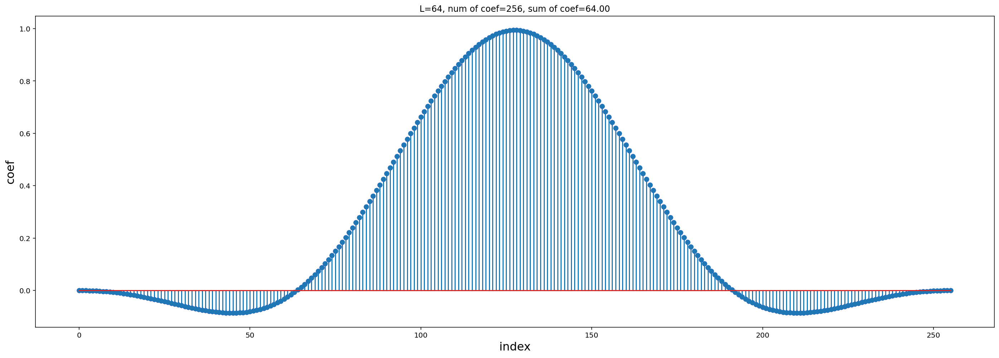

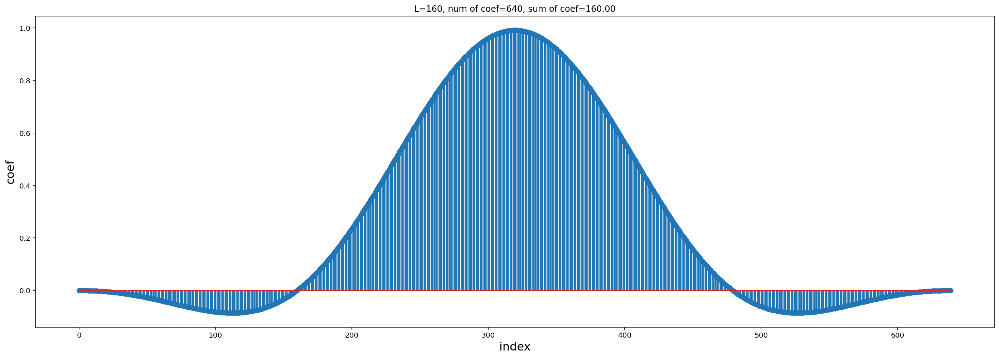

In [8]:
coef_15 = get_coef(L=15)
plot_coef(coef_15)
coef_64 = get_coef(L=64)
plot_coef(coef_64)
coef_160 = get_coef(L=160)
plot_coef(coef_160)

# Optimizations

The zeroes introduced by the upsampler are processed by the FIR filter, which means that of every $L$ multiplications performed by the FIR filter, $L{-}1$ of them are multiplications between a zero and a coefficient.  Furthermore of all of the samples leaving the FIR filter only $\frac{1}{M}$ are actually used in the output of the
scaler. Clearly, this is a waste of resources if implemented naively.

If we write down the equation for the system and then expand and simplify it, we obtain the following equivalent formula:

\begin{align}
y[n] &= \sum_{j = 0}^{3} h[jL + nM \textbf{ mod } L] x[nM \textbf{ div } L - j] \\
h[n] &= \text{lanczos2}(\frac{n}{L}-2)
\end{align}

which is the basis for a much more sofisticated upscaler. Note that $h[n] = 0$ only for $n \in \{0,L,3L\}$, so that there are still
some multiplications with zero taking place, but not many.

## Task 2

- Derive the optimized equation for $y[n]$ that forms the basis for a sofisticated upscaler design.
- The optimized equation for $y[n]$ uses different coefficients for each output $y[n]$, however the pattern of coefficients repeats.  What is the period of this pattern, i.e., what is the minimum value P such that the computations of $y[n]$ and $y[n{+}P]$ use the same coefficients
- The optimized equation for $y[n]$ uses a window  of 4 consecutive input values for each output $y[n]$. Most of the time the window for $y[n{+}1]$ is shifted by 1 with respect to the the window for $y[n]$. Occasionally, however, $y[n{+}1]$ and $y[n]$ are computed from the same window. Show that this happens when $(nM) \textbf{ mod } L + M < L$. 

<center><font color=blue size="5">
Insert the computations and answers for Task 2 here.
</font></center>

First, the modulo operators `mod` and `div` are needed to be formalized. For an integer $M$ and a positive number $L$, $M~\mathbf{div}~L$ and $M~\mathbf{mod}~L$ are used to denote the **quotient** and the **remainder** of $M \div L$, respectively, *i.e.* if we have
$$
\begin{align}
w &= M~\mathbf{div}~L \\
l &= M~\mathbf{mod}~L
\end{align}
$$
then
$$
M = wL + l, \textit{where}\ l \in [0, L)
$$

From another perspective, if we want to access $M$ in blocks of size $L$, we can also state that $w$ here is the index of blocks, whereas $l$ is the location within that block.

### Derivation of `y[n]`

The scaler consists of three components. Using the representations above, they are

- An $L$-up sampler

$$
    p[n] = 
    \begin{cases}
    x[n~\mathbf{div}~L], & \textit{if $n~\mathbf{mod}~L=0$} \\
    0,                   & \textit{otherwise}
    \end{cases}
\tag{1}$$

- An low-pass filter

$$
    q[n] = \sum_{0 \le j < 4L}h[j]p[n-j]
\tag{2}$$

- An $M$-down sampler
$$
    y[k] = q[kM]
\tag{3}$$

Then
$$
\begin{align}
y[k] &= q[kM] \\
     &= \sum_{0 \le j < 4L}h[j]p[kM-j]                                     & \textit{using $(2)$} \\
     &= \sum_{0 \le j < 4L}h[j]\begin{cases}
            x[(kM-j)~\mathbf{div}~L], & \textit{if $(kM-j)~\mathbf{mod}~L=0$} \\
            0,                              & \textit{otherwise}
        \end{cases}                                                        & \textit{using $(1)$} \\
     &= \sum_{\substack{
            (0 \le j < 4L) \wedge \\
            (kM-j)~\mathbf{mod}~L=0
        }}h[j]x[(kM-j)~\mathbf{div}~L] \\
     &= \sum_{0 \le w < 4}\sum_{\substack{
            (0 \le l < L-1) \wedge \\
            [kM-(wL+l)]~\mathbf{mod}~L=0
        }}h[wL+l]x[(kM-(wL+l))~\mathbf{div}~L]                             & \textit{assuming $j=wL+l$. $w,l\in \mathbb{N}$, $l\in[0, L)$} \\
     &= \sum_{0 \le w < 4}\sum_{\substack{
            (0 \le l < L-1) \wedge \\
            l=kM~\mathbf{mod}~L
        }}h[wL+l]x[(kM-(wL+l))~\mathbf{div}~L]                             & \textit{because}\ [kM-(wL+l)]~\mathbf{mod}~L=0\iff l=kM~\mathbf{mod}~L\\
     &= \sum_{0 \le w < 4}
        h[wL+kM~\mathbf{mod}~L]x[(kM-wL-kM~\mathbf{mod}~L)~\mathbf{div}~L] & \textit{because}\ l=kM~\mathbf{mod}~L \\
     &= \sum_{0 \le w < 4}
        h[wL+kM~\mathbf{mod}~L]x[((kM~\mathbf{div}~L)\cdot L-wL)~\mathbf{div}~L] 
                                                                           & \textit{because}\ kM-kM~\mathbf{mod}~L = (kM~\mathbf{div}~L)\cdot L \\ 
     &= \sum_{w=0}^{3}
        h[wL+kM~\mathbf{mod}~L]x[(kM~\mathbf{div}~L)-w]
\end{align}
$$

Finally, we substitude every $k$ by $n$, and every $w$ by $j$, we will get the sophisticated formula of `y[n]`.

$$
y[n] = \sum_{j=0}^{3}h[jL+nM~\mathbf{mod}~L]x[(nM~\mathbf{div}~L)-j]
\tag{4}$$

### The period of the pattern

We know that

$$
\begin{align}
y[n] &= \sum_{j=0}^{3}h[jL+nM~\mathbf{mod}~L]x[(nM~\mathbf{div}~L)-j] \\
y[n+P] &= \sum_{j=0}^{3}h[jL+(n+P)M~\mathbf{mod}~L]x[((n+P)M~\mathbf{div}~L)-j] \\
\end{align}
$$

Here we only observe the indexes of coefficients $h$, so the period `P` of the repeated pattern is equal to the minimal solution of `P` in the following equation:

$$
\begin{align}
jL+nM~\mathbf{mod}~L &= jL+(n+P)M~\mathbf{mod}~L & \textit{indexes are the same} \\
nM~\mathbf{mod}~L &= (n+P)M~\mathbf{mod}~L       & \textit{minus $jL$ on both side} \\
nM~\mathbf{mod}~L &= (nM+PM)~\mathbf{mod}~L \\
nM &\equiv (nM+PM)~\mathbf{mod}~L                & \textit{congruence modulo}
\end{align}
$$

The congruence relation is **compatible with subtraction**, *i.e.* if $a_1 \equiv b_1~\mathbf{mod}~n$ and $a_2 \equiv b_2~\mathbf{mod}~n$, then $(a_1-a_2) \equiv (b_1-b_2)~\mathbf{mod}~n$ [[1]](#1). So we can further simplify the equation:

$$
\begin{align}
nM &\equiv (nM+PM)~\mathbf{mod}~L \\
0 &\equiv PM~\mathbf{mod}~L                      & \textit{compatibility with subtraction, $nM \equiv nM~\mathbf{mod}~L$ holds naturally}
\end{align}
$$

That is to say, $PM$ is the least multiple of $L$. Note that here $P \in N^+$. Therefore, $P=\frac{L}{gcd(L, M)}$, where $gcd(a, b)$ returns the greatest common divisor of $a$ and $b$.

### Elaborating the same window issue

In this section, we show that $y[n+1]$ and $y[n]$ are computed from the same window when $(nM)~\mathbf{mod}~L+M < L$. Different from the last section, the indexes of `x` should be considered here. We have

$$
\begin{align}
y[n] &= \sum_{j=0}^{3}h[jL+nM~\mathbf{mod}~L]x[(nM~\mathbf{div}~L)-j] \\
y[n+1] &= \sum_{j=0}^{3}h[jL+(n+1)M~\mathbf{mod}~L]x[((n+1)M~\mathbf{div}~L)-j]
\end{align}
$$

$y[n+1]$ and $y[n]$ are computed from the same window is equivalent to the statement that the indexes of `x` are the same, *i.e.*

$$
\begin{align}
(nM~\mathbf{div}~L)-j &= ((n+1)M~\mathbf{div}~L)-j \\
nM~\mathbf{div}~L &= (n+1)M~\mathbf{div}~L
\end{align}
$$

We assume that $w=nM~\mathbf{div}~L$ and $l=nM~\mathbf{mod}~L$, then $nM = wL+l$, and $(n+1)M=nM+M=wL+l+M$. So

$$
\begin{align}
nM~\mathbf{div}~L &= (n+1)M~\mathbf{div}~L \\
(wL+l)~\mathbf{div}~L &= (wL+l+M)~\mathbf{div}~L & \textit{by definition of $w$ and $l$} \\
w &= w + (l+M)~\mathbf{div}~L                    & \textit{by definition of $w$ and $l$} \\
0 &= (l+M)~\mathbf{div}~L \\
(nM~\mathbf{mod}~L + M)~\mathbf{div}~L &= 0      & \textit{by definition of $l$} \\
(nM)~\mathbf{mod}~L + M &< L                       & \textit{by definition of $\mathbf{div}$, quotient=0 means the dividend is less than the divisor}\\
\end{align}
$$

Hence, $y[n+1]$ and $y[n]$ are computed from the same window only when $(nM)~\mathbf{mod}~L+M < L$.

## Question 1

Assume that the optimized filter is implemented by a single SDF-node. Each firing of this node is according to one of the following two firing rules (see the StaccatoLab tutorial for more on firing rules):
- ```fire(rule(I=[1], O=[1], s= ...)```
- ```fire(rule(I=[0], O=[1], s= ...)```

The last item of the previous task shows that these rules are applied according to a pattern. 
- What is the period of this pattern? 
- What does this imply for the number of states of the finite state machine responsible for the firings and the computation of the output tokens?



<center><font color=blue size="5">
Insert the answers to Question 1 here.
</font></center>

### The period of the pattern

When the firing rule `fire(rule(I=[0], O=[1], s= ...)` are applied, it means that this iteration of `y` are calculated from the same `x` as the previous iteration, *i.e.* the same window. So here, the pattern is the same as the section 4.1.3 above. We have known that $y[n+1]$ and $y[n]$ are computed from the same window only when $(nM)~\mathbf{mod}~L+M < L$. Based on this conclusion, this question is equivalent to find the minimal positive integer solution of $\mathcal{P}$ that satisfies $(n+\mathcal{P})M~\mathbf{mod}~L + M < L$ given $nM~\mathbf{mod}~L + M < L$. This means that $y[n+\mathcal{P}+1]$ and $y[n+\mathcal{P}]$ are **also** computed from the same window. The only safe choice for $\mathcal{P}$ here is to keep $(n+\mathcal{P})M$ and $nM$ congruent modulo $L$ or the indexes of `x` within the block of length $L$ will be unpredictable. So we have

$$
\begin{align}
nM &\equiv (n+\mathcal{P})M~(\mathbf{mod}~L) \\
0 &\equiv \mathcal{P}M~(\mathbf{mod}~L) & \textit{compatibility with subtraction, $nM \equiv nM~\mathbf{mod}~L$ holds naturally}
\end{align}
$$

That is to say, $\mathcal{P}M$ is the least multiple of $L$. Note that here $\mathcal{P} \in N^+$. Therefore, $\mathcal{P}=\frac{L}{gcd(L, M)}$, where $gcd(a, b)$ returns the greatest common divisor of $a$ and $b$. The answer here is the same as the second sub-task in Task 2. We can also use examples to have a check. In the following block, the values of $L$ and $M$ are free to change to check the period.

In [9]:
def get_period(ind):
    length = len(ind)-1
    step_list = [ind[i+1]-ind[i] for i in range(length)]
    attempt_step = math.floor(length/2)
    for i in range(1, attempt_step+1):
        period_ind_list = [step_list[j*i:(j+1)*i] for j in range(length//i)]
#         print(period_ind_list)
        if period_ind_list[1:] == period_ind_list[:-1]:
            return sum(period_ind_list[0])
    return 'UNKNOWN, please increase the n_iteration'

In [10]:
def get_real_repeat_index(L, M, find_range, log=False):
    prev_ind_x = [0, 0, 0, 0]
    repeat_ind = []
    for n in range(find_range):
        this_ind_x = []
        if log:
            print("y[%d]=" % n, end='')
        for j in range(4):
            h_ind = j*L+((n*M)%L)
            x_ind = ((n*M)//L)-j
            if log:
                print("h[%d]x[%d]" % (h_ind, x_ind), end=' ')
            this_ind_x.append(x_ind)
            if j != 3:
                if log:
                    print('+ ', end='')           
        if this_ind_x == prev_ind_x:
            if log:
                print(" -- X REPEAT", n)
            repeat_ind.append(n)
        else:
            if log:
                print()
        prev_ind_x = this_ind_x
    return repeat_ind

In [11]:
L = 160
M = 147

n_iteration = 500

print('estimated period =', int(L/math.gcd(L, M)))
print('real period =', get_period(get_real_repeat_index(L, M, n_iteration, log=False)))

estimated period = 160
real period = 160


From the code and its output above, we can find out that $\frac{L}{gcd(L, M)}$ is indeed the period of the pattern (note that for $L=160$ and $M=147$, the period is 160, rather than 12, which can be proven from the simulation that the intervals fluctuate from 12 to 13. The true period is 160 for this particular case).

### The number of states within the finite state machine

The number of the state in the finite state machine (FSM) is equal to the period $\mathcal{P}$ of the pattern, i.e. after $\mathcal{P}$ firings, the FSM returns to its initial value. 

---

Scalers can be implemented by cascading several scalers to form a composite scaler. To implement a scaler with a ratio of $\frac{15}{4}$ one might cascade two scalers of ratio $\frac{3}{2}$ and $\frac{5}{2}$.  In such an implementation care has to be taken that the sample rate of the signal between the individual scalers does not fall below the output sample rate of the composite scaler. Otherwise information in the signal will be lost.

So, when designing a scaler, we have to make 2 design choices with 2 options each.  First of all, we can either design a *monolithic* scaler, or *composite* one consisting of a cascade of subscalers with smaller conversion ratios.  Secondly, we can either use the *naive* implementation with an upsampler, a FIR filter and a downsampler or use the *sofisticated* implementation that uses the optimized equation for $y[n]$. This leads to four possible designs, and which of the designs is best may depend on the application. Furthermore, since multiplication of rational numbers is a symmetric operation, the order in which the subscalers are cascaded does not matter for the conversion ratio to be achieved. So, for each cascaded design involving F subscalers, there are $F!$ versions, each corresponding to a different order.

Note that all equations given above are for upscalers only. So if you build a composite scaler, make sure every individual scaler is an upscaler. For the ratio $\frac{160}{147}$ (which is used for upscaling from 44.1 to 48 kHz) this can be accomplished by using scalers of ratios $\frac{64}{63}$ and $\frac{15}{14}$.

## Question 2

Determine for each of the the six possible designs (1 monolithic and 2 cascades, each naive or sophisticated)
- The number of multiplications performed per output.
- The total number of coefficients required.
- The highest sample rate inside the system.

<center><font color=blue size="5">
Insert the answers to Question 2 here.
</font></center>

We first list the six possible designs and number them for easier and clean presentation. The corresponding relation is

Index | Design
:---  | :---
1     | monolithic, $\frac{160}{147}$, sophisticated
2     | monolithic, $\frac{160}{147}$, naive
3     | cascades, $\frac{64}{63}$ then $\frac{15}{14}$, sophisticated
4     | cascades, $\frac{64}{63}$ then $\frac{15}{14}$, naive
5     | cascades, $\frac{15}{14}$ then $\frac{64}{63}$, sophisticated
6     | cascades, $\frac{15}{14}$ then $\frac{64}{63}$, naive

### The number of multiplications performed per output

In general, we believe that $\mathbf{mod}$ and $\mathbf{div}$ does not involve in multiplications with respect to hardware implementation. Concretely, $a~\mathbf{mod}~b$ can be compute by a & (b-1), where `&` denotes bitwise AND [[2]](#2). And $\mathbf{div}$ is equivalent to multiple substractions. Hence, these two operators will not affect the number of multiplications. In another word, we should only focus on the formulas. More specificaly, the number of multiplications only depends on the formula of the low-pass filter, because both the up- and down-sampler do not need multiplications.

For naive scalers, Formula $(2)$ shows that $4L$ multiplications are needed, and $9$ for sophisticated one according to Formula $(4)$, regardless of the value of $L$ and $M$. Concretely, 1 time for calculating $n*M$, 4 for $j*L$, and 4 for $h*x$. For cascade scalers, the final number should be the product of each components if $M$s are different for all components. Therefore, the summary of the numbers of multiplications for six designs is

Index | Design                                                                                   | The number of multiplications
:---  | :---                                                                                     | :---
1     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, sophisticated                  | <div style="width: 250pt"> 9
2     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, naive                          | <div style="width: 250pt"> 640 ($4*L=4*160=640$)
3     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, sophisticated | <div style="width: 250pt"> 81 ($9*9=81$)
4     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, naive         | <div style="width: 250pt"> 15360 ($4*L_1*4*L_2=4*64*4*15=15360$)
5     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, sophisticated | <div style="width: 250pt"> 81 ($9*9=81$)
6     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, naive         | <div style="width: 250pt"> 15360 ($4*L_1*4*L_2=4*64*4*15=15360$)

### The total number of coefficients required

The number of coefficients needed depends only on the value of $L$ ($4L$ specifically, for the most generic cases). For cascade scalers, the sum of each components is the final answer. So we have

Index | Design                                                                                   | The number of coefficients
:---  | :---                                                                                     | :---
1     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, sophisticated                  | <div style="width: 250pt"> 640 ($4*L=4*160=640$)
2     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, naive                          | <div style="width: 250pt"> 640 ($4*L=4*160=640$)
3     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, sophisticated | <div style="width: 250pt"> 316 ($4*L_1+4*L_2=4*64+4*15=316$)
4     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, naive         | <div style="width: 250pt"> 316 ($4*L_1+4*L_2=4*64+4*15=316$)
5     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, sophisticated | <div style="width: 250pt"> 316 ($4*L_1+4*L_2=4*64+4*15=316$)
6     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, naive         | <div style="width: 250pt"> 316 ($4*L_1+4*L_2=4*64+4*15=316$)

### The highest sample rate inside the system

We know that `input_rate=44.1 kHz`. For sophisticated designs, we can observe from `get_real_repeat_index()` that to generate $L$ output, there are only $M$ input required. So regardless of the choices of monolithic or cascade fashion, the highest sample rate will be the target rate for upscalers (48 KHz in this case). 

But for naive designs, the signals should first be upsample $L$ times. So in monolithic fashion, the highest sample rate will be $L\times input\_rate$. Whereas for cascade fashion, we should check the output rate step by step to obtain the highest rates. We can also provide a more formalized description. For designs in cascade fasion consisted of $\mathcal{W}$ components, $L_w$, $M_w$ are the parameters for the $w$-*th* scaler, the highest sample rate $\mathcal{R_{max}}$ is:

$$
\begin{align}
\mathcal{R_{max}} = \mathop{\max}_{1 \le w \le \mathcal{W}}\frac{input\_rate\times \prod_{i=1}^{w}L_i}{\prod_{j=1}^{w-1}M_j}
\end{align}
$$

Therefore, the highest sample rates for 6 design choices are: 

Index | Design                                                                                   | The highest sample rate
:---  | :---                                                                                     | :---
1     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, sophisticated                  | <div style="width: 350pt"> 48 kHz
2     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, naive                          | <div style="width: 350pt"> 7.056 MHz ($L*input\_rate=160*44.1kHz=7.056MHz$)
3     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, sophisticated | <div style="width: 350pt"> 48kHz
4     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, naive         | <div style="width: 350pt"> 2.8224 MHz ($\frac{input\_rate\times L_1\ \ \ }{1}=64*44.1kHz=2.8224MHz$)
5     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, sophisticated | <div style="width: 350pt"> 48kHz
6     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, naive         | <div style="width: 350pt"> 3.024 MHz ($\frac{input\_rate\times L_1 \times L_2\ \ \ }{M_1}=3.024MHz$)

# Implementation

From the 6 upscaler designs that you have examined in the previous section, you have to design, i.e., program a SDF-graph, <span style="color:blue">**all** </span> versions that satisfy the following requirements:

- The output sample rate must be $\frac{48000}{44100}$ times the input sample rate.
- The output represents a resampled version of the input.
- The design must support an input sample rate of at least 44.1kHz.
- The nodes of graph may not run at more than 100KHz.
- The design may produce start-up noise.

Before you proceed clearly state which versions meet the requirements.

The formulas for the scaler assume that all numbers are reals. However, we cannot work with reals in practice, so we need to *quantize* all values. We can use either floating point or integers. 

First create, for each version, an implementation that uses floating point numbers. In such an implementation only the input samples that the system receives are already signed 16 bit values. 

Next create, for each version, an implementation that uses only integers. For these implementations the coefficients must also be quantized. This can be done by multiplying the floating point values by a power of 2, say ($2^{15} = 32768$) and then round off. The resulting coefficients should lie in the range $[-32768, 32768]$. After computing the sum, the result should be divided by 32768 and rounded again to obtain the proper output. Division by 32768 is trivial in hardware, discard the 15 least significant bits. Another way of looking at this is that 15 fractional bits are used during the computation. 

Make sure your intermediate values have enough bits. If you do not reserve enough bits, the resulting samples might be wrong. Before outputing the result of the computation, also make sure to check for overflow: if it occurs, set the output to the closest representable output value. Overflow is impossible to avoid using the lanczos2 filter (can you see why?).

Motivate additional design choices such as
- the initial token load and slack
- the finite state machine that defines the behavior of your SDF
    - in particular, the number and encoding of states and firing rules 
- other aspects you deem relevant

<center><font color=blue size="5">
Insert your StaccatoLab dataflow graphs here.
</font></center>

## Versions meet the requirements

Among the requirements, the most decisive one is the limitation of the node rate, concretely, no more than 100kHz. According to the results in section 4.3.3, no naive designs satisfy this. Hence, the versions that meet the requirements are the sophisticated ones, both monolithic and cascades. To be specific, in the rest of this report, we will focus on three design choices.

Index | Design
:---  | :---
1     | monolithic, $\frac{160}{147}$, sophisticated
2     | cascades, $\frac{64}{63}$ then $\frac{15}{14}$, sophisticated
3     | cascades, $\frac{15}{14}$ then $\frac{64}{63}$, sophisticated


## Preliminary

In this section, we will list possible firing rules, investigate the finite state machine (FSM), and implement some useful functions for later usage.

### Firing rules

In this task, we are required to build an SDF-graph. According to the analysis in the previous chapters, there are firing patterns within the sophisticated designs. Concretely, for most firings, there are one enqueue and one dequeue. But sometimes, the output will only rely on the current `x`, rather than new ones. This phenomenon is called *same window*. So there are two kinds of firing rules:

- consume 1 token and generate 1 token: `{I=[1], O=[1]}`
- consume 0 token and generate 1 token: `{I=[0], O=[1]}`

### Input source nodes

Here we define a function to generate different kind of input node to help later use. The function below provides three kinds of nodes as input: `mp3`, `block_wave`, and `dummy`.

In [12]:
def generate_block_wave(block_len, rate, t=2, plot=False):
    magnitude = 2000
    total_len = rate * t
    one_period = [magnitude] * block_len + [0] * block_len
    res = one_period * (total_len//(2*block_len))
    remained_len = total_len - len(res)
    if remained_len > block_len:
        res += [magnitude] * block_len + [0] * (block_len-remained_len)
    else:
        res += [magnitude] * remained_len
    if plot:
        plt.figure(figsize=(24, 5))
        plt.plot(np.linspace(0, t, total_len), res)
        plt.xlabel('time [sec]')
        plt.ylabel('magnitude')
        plt.title("block wave, block length=%d, signal rate=%.1f kHz, t=%.2f s" %(block_len, rate/1000, t))
        plt.xlim([0, t])
        plt.show()
    return res

In [13]:
def specify_input(in_type, block_len=50, rate=44100, t=5, plot=False):
    if in_type == 'mp3':
        return MP3(mp3='../audio/sultans.mp3', tmin=0.7, rate=44100)
    elif in_type == 'block_wave':
        return SRC(rom=generate_block_wave(block_len, rate, t, plot), rate=rate)
    elif in_type == 'dummy':
        return SRC(rom=[0 for i in range(1000)])
    else:
        raise Exception('unsupported type!')

### Finite state machine (FSM)

We have already found out the *same window* period is $\frac{L}{gcd(L,M)}$ in the section 4.2.1. Now, we need to take a closer look at what happens within one period and specify the FSMs based on the internal behaviors.

First, for $L=160$ and $M=147$, the internal behavior in one period are as follows.

In [14]:
def get_details_in_period(L, M):
    P = int(L/math.gcd(L, M))
    print(get_real_repeat_index(L, M, P, log=True))

In [15]:
get_details_in_period(160, 147)

y[0]=h[0]x[0] + h[160]x[-1] + h[320]x[-2] + h[480]x[-3] 
y[1]=h[147]x[0] + h[307]x[-1] + h[467]x[-2] + h[627]x[-3]  -- X REPEAT 1
y[2]=h[134]x[1] + h[294]x[0] + h[454]x[-1] + h[614]x[-2] 
y[3]=h[121]x[2] + h[281]x[1] + h[441]x[0] + h[601]x[-1] 
y[4]=h[108]x[3] + h[268]x[2] + h[428]x[1] + h[588]x[0] 
y[5]=h[95]x[4] + h[255]x[3] + h[415]x[2] + h[575]x[1] 
y[6]=h[82]x[5] + h[242]x[4] + h[402]x[3] + h[562]x[2] 
y[7]=h[69]x[6] + h[229]x[5] + h[389]x[4] + h[549]x[3] 
y[8]=h[56]x[7] + h[216]x[6] + h[376]x[5] + h[536]x[4] 
y[9]=h[43]x[8] + h[203]x[7] + h[363]x[6] + h[523]x[5] 
y[10]=h[30]x[9] + h[190]x[8] + h[350]x[7] + h[510]x[6] 
y[11]=h[17]x[10] + h[177]x[9] + h[337]x[8] + h[497]x[7] 
y[12]=h[4]x[11] + h[164]x[10] + h[324]x[9] + h[484]x[8] 
y[13]=h[151]x[11] + h[311]x[10] + h[471]x[9] + h[631]x[8]  -- X REPEAT 13
y[14]=h[138]x[12] + h[298]x[11] + h[458]x[10] + h[618]x[9] 
y[15]=h[125]x[13] + h[285]x[12] + h[445]x[11] + h[605]x[10] 
y[16]=h[112]x[14] + h[272]x[13] + h[432]x[12] + h[592]x[11]

We can see that within one period, the inputs of indexes $[1, 13, 25, 37, 50, 62, 74, 87, 99, 111, 124, 136, 148]$ use the same `x` as their previous outputs. Similarly, for $L=15$, $M=14$ and $L=64$, $M=63$, we can also do the same thing to observe the detailed behaviors.

In [16]:
get_details_in_period(64, 63)

y[0]=h[0]x[0] + h[64]x[-1] + h[128]x[-2] + h[192]x[-3] 
y[1]=h[63]x[0] + h[127]x[-1] + h[191]x[-2] + h[255]x[-3]  -- X REPEAT 1
y[2]=h[62]x[1] + h[126]x[0] + h[190]x[-1] + h[254]x[-2] 
y[3]=h[61]x[2] + h[125]x[1] + h[189]x[0] + h[253]x[-1] 
y[4]=h[60]x[3] + h[124]x[2] + h[188]x[1] + h[252]x[0] 
y[5]=h[59]x[4] + h[123]x[3] + h[187]x[2] + h[251]x[1] 
y[6]=h[58]x[5] + h[122]x[4] + h[186]x[3] + h[250]x[2] 
y[7]=h[57]x[6] + h[121]x[5] + h[185]x[4] + h[249]x[3] 
y[8]=h[56]x[7] + h[120]x[6] + h[184]x[5] + h[248]x[4] 
y[9]=h[55]x[8] + h[119]x[7] + h[183]x[6] + h[247]x[5] 
y[10]=h[54]x[9] + h[118]x[8] + h[182]x[7] + h[246]x[6] 
y[11]=h[53]x[10] + h[117]x[9] + h[181]x[8] + h[245]x[7] 
y[12]=h[52]x[11] + h[116]x[10] + h[180]x[9] + h[244]x[8] 
y[13]=h[51]x[12] + h[115]x[11] + h[179]x[10] + h[243]x[9] 
y[14]=h[50]x[13] + h[114]x[12] + h[178]x[11] + h[242]x[10] 
y[15]=h[49]x[14] + h[113]x[13] + h[177]x[12] + h[241]x[11] 
y[16]=h[48]x[15] + h[112]x[14] + h[176]x[13] + h[240]x[12] 
y[17]=h[47]x[16] + 

In [17]:
get_details_in_period(15, 14)

y[0]=h[0]x[0] + h[15]x[-1] + h[30]x[-2] + h[45]x[-3] 
y[1]=h[14]x[0] + h[29]x[-1] + h[44]x[-2] + h[59]x[-3]  -- X REPEAT 1
y[2]=h[13]x[1] + h[28]x[0] + h[43]x[-1] + h[58]x[-2] 
y[3]=h[12]x[2] + h[27]x[1] + h[42]x[0] + h[57]x[-1] 
y[4]=h[11]x[3] + h[26]x[2] + h[41]x[1] + h[56]x[0] 
y[5]=h[10]x[4] + h[25]x[3] + h[40]x[2] + h[55]x[1] 
y[6]=h[9]x[5] + h[24]x[4] + h[39]x[3] + h[54]x[2] 
y[7]=h[8]x[6] + h[23]x[5] + h[38]x[4] + h[53]x[3] 
y[8]=h[7]x[7] + h[22]x[6] + h[37]x[5] + h[52]x[4] 
y[9]=h[6]x[8] + h[21]x[7] + h[36]x[6] + h[51]x[5] 
y[10]=h[5]x[9] + h[20]x[8] + h[35]x[7] + h[50]x[6] 
y[11]=h[4]x[10] + h[19]x[9] + h[34]x[8] + h[49]x[7] 
y[12]=h[3]x[11] + h[18]x[10] + h[33]x[9] + h[48]x[8] 
y[13]=h[2]x[12] + h[17]x[11] + h[32]x[10] + h[47]x[9] 
y[14]=h[1]x[13] + h[16]x[12] + h[31]x[11] + h[46]x[10] 
[1]


We can observe that for both $L=15$, $M=14$ and $L=64$, $M=63$, only the output of index $1$ depends on the same `x` as the previous one. Then, we can build a function to specify the FSM given $L$ and $M$ according to the references output above as follows. Note that here we mainly use the `Repeat()` methods, because except outputs of *same window* indexes, other outputs behave the same.

In [18]:
def specify_fsm(node, L, M):
    if L == 160 and M == 147:
        node.fsm.add(0, Fire(Rule(I=[1], O=[1], s=1)))  # 0
        node.fsm.add(1, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=2)))   # 1-12
        node.fsm.add(2, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=3)))   # 13-24
        node.fsm.add(3, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=4)))   # 25-36
        node.fsm.add(4, 
            Repeat(13, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=5)))   # 37-49
        node.fsm.add(5, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=6)))   # 50-61
        node.fsm.add(6, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=7)))   # 62-73
        node.fsm.add(7, 
            Repeat(13, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=8)))   # 74-86
        node.fsm.add(8, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=9)))   # 87-98
        node.fsm.add(9, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=10)))  # 99-110
        node.fsm.add(10, 
            Repeat(13, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=11)))  # 111-123
        node.fsm.add(11, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=12)))  # 124-135
        node.fsm.add(12, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=13)))  # 136-147
        node.fsm.add(13, 
            Repeat(12, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=0)))   # 148-159
    elif L == 64 and M == 63:
        node.fsm.add(0, Fire(Rule(I=[1], O=[1], s=1)))  # 0
        node.fsm.add(1, 
            Repeat(63, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=0)))     # 1-63
    elif L == 15 and M == 14:
        node.fsm.add(0, Fire(Rule(I=[1], O=[1], s=1)))  # 0
        node.fsm.add(1, 
            Repeat(14, enter=Rule(I=[0], O=[1]),
                       iter=Rule(I=[1], O=[1]),  
                       exit=Rule(I=[1], O=[1], s=0)))     # 1-14
    else:
        raise Exception('unsupported config!')
    return node

Using this function, we can configurate the FSM of nodes by $L$ and $M$. Now we can have a try by define a dummy graph and specify three nodes by the three configurations in this assignment, respectively.

In [19]:
G_test = Graph()
G = G_test

G.src = specify_input('dummy')

G.node1 = Node(I=G.src)
G.node1 = specify_fsm(G.node1, 160, 147)
G.snk1 = Node(I=G.node1.O[0])

G.node2 = Node(I=G.src)
G.node2 = specify_fsm(G.node2, 64, 63)
G.snk2 = Node(I=G.node2.O[0])

G.node3 = Node(I=G.src)
G.node3 = specify_fsm(G.node3, 15, 14)
G.snk3 = Node(I=G.node3.O[0])

G_test.build()

G_test (Graph)    : no errors


First, when $L=160$, $M=147$, the FSM is shown as follows. This kind of FSM consists of 14 states, which is exactly the number of indexes satisfying *same window* plus 1 (initial state). In the later usage, the FSM for $L=160$, $M=147$ is the same. We only need to specify the `fo()` function.

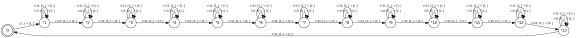

In [20]:
G_test.node1.fsm.plot()

Similarly, for $L=64$, $M=63$ and $L=15$, $M=14$, there are only 2 states, which are also the number of *same window* indexes plus 1 (initial state). These two kinds of FSM will mainly be utilized for cascade designs.

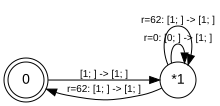

In [21]:
G_test.node2.fsm.plot()

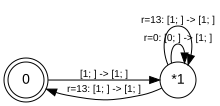

In [22]:
G_test.node3.fsm.plot()

With the help of these functions and analysis, we can start to build the graph.

## Floating point implementations

In this section, we will build graphs of float-precision for three design versions. To obtain an elementary glance at the graph, we can check the output rate by `G.view()`. So an auxiliary function is defined as follows to help us to perform initial checks. For every graph, we will set the `mp3` of rate 44.1 *kHz* as input, if we manage to get an output of rate 48 *kHz*, we will have confidence in later simulations.

In [23]:
def basic_view(G):
    G.reset()
    G.view(sim=True)

The FSMs we use in the later implementations have been explained in detail in section 5.2.3. So we will not repeat here. In this section, we will only focus on the specification of `fo()`, initial tokens and slacks.

For `float` point precision, actually we can directly implement `fo()` according to the formal specification in Formula $(4)$. Note that within the formula, we need to know the current index of the output, so an auxiliary counter will be helpful.

### Float, monolithic, 160/147, sophisticated version

First, we set the values of $L$ and $M$, and coefficients.

In [24]:
L, M = 160, 147
h = coef_160

Then, the float-precision, monolithic, sophisticated scaler of $L=160$ and $M=147$ is inplemented in `G_mono_float`.

In [25]:
def get_mono_float(input='mp3'):
    G = Graph(rate=48000); 
    G.src = specify_input(input)

    G.fir = Node(I=[G.src, 1], fo= [lambda x: sum([h[j*L+((x[1]*M)%L)]*x[0][4-j-1] for j in range(4)]), 
                                    lambda x: x[1]+1 if x[1] < (L-1) else 0])

    G.fir.I[0].init(x=[0, 0, 0, 0])
    G.fir.I[1].init(D=1, x=[0])

    G.fir = specify_fsm(G.fir, 160, 147)

    G.snk = Node(I=G.fir.O[0])
    return G

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_mono_float (Graph): no errors


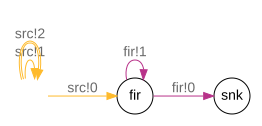

In [26]:
G_mono_float = get_mono_float()
G = G_mono_float
G.build(); 
G.plot_graph()

#### Design choices

For `fo()`, we add an auxiliary input `x[1]` as an counter to indicate the index of current output. This design will be kept for later use, so we will not repeat.

With respect to initialization of edges, the input edge of `G.fir`, specifically, there are two input channels: one for the `mp3` signal, and the other for the counter. For the first input channel for `mp3`, since the window for calculating the output is 4, we need to add 4 initial tokens in the data queue on the edge for the first output. Meanwhile, the rate of this edge is theoretically less than the graph rate (48 *kHz*), so default setting `D=0, S=1` will work. For the other input channel for the counter, its rate is equal to the graph / the output, so $D=1$ is enough for this edge. And the initial data on this edge should be 0, which is the index of the first output.

Now, we can use `basic_view` to check the rate of the output edge (simulate for $T$, then select `rates` in `view` below). We can see that the output signal is of rate 48 kHz (just like the picture below), which illustrates the vaidity initially.

![avatar](https://storage.live.com/items/A0F74AFD0BA8282D!827891?authkey=ABXqzzrLcu36XDU)

In [27]:
# if you want to use this block, please first RE-RUN it.
L, M = 160, 147
basic_view(G_mono_float)

Output()

### Float, cascades,  64/63  then  15/14 , sophisticated version

First, we set the parameters for the first and second components, and corresponding coefficients.

In [28]:
L1, M1 = 64, 63
h1_64 = coef_64
L2, M2 = 15, 14
h2_15 = coef_15

Then, the float-precision, cascade, sophisticated scaler of $L_1=64$, $M_1=63$ and $L_2=15$, $M_2=14$ is inplemented in `G_casc_6415_float`.

In [29]:
def get_casc_6415_float(input='mp3'):
    G = Graph(rate=48000); 
    G.src = specify_input(input)

    G.fir1 = Node(I=[G.src, 1], fo= [lambda x: sum([h1_64[j*L1+((x[1]*M1)%L1)]*x[0][4-j-1] for j in range(4)]), 
                                    lambda x: x[1]+1 if x[1] < (L1-1) else 0])
    G.fir2 = Node(I=[G.fir1.O[0], 1], fo= [lambda x: sum([h2_15[j*L2+((x[1]*M2)%L2)]*x[0][4-j-1] for j in range(4)]), 
                                           lambda x: x[1]+1 if x[1] < (L2-1) else 0])

    G.fir1.I[0].init(x=[0, 0, 0, 0])
    G.fir1.I[1].init(D=1, x=[0])
    G.fir2.I[0].init(x=[0, 0, 0, 0])
    G.fir2.I[1].init(D=1, x=[0])

    G.fir1 = specify_fsm(G.fir1, 64, 63)
    G.fir2 = specify_fsm(G.fir2, 15, 14)

    G.snk = Node(I=G.fir2.O[0])
    return G

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_6415_float (Graph): no errors


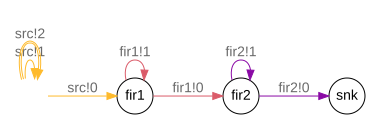

In [30]:
G_casc_6415_float = get_casc_6415_float() 
G = G_casc_6415_float
G.build(); 
G.plot_graph()

#### Design choices

The initializations of input edges of cascade nodes are exactly the same as the monolithic one, because they basically show no differences from the single node design. The reason is the rate is lifted step by step, that is to say, the rates of arbitrary inputs for signals are less than expected output rate. So the default setting suffices.

And the specification for `fo()` does not change no matter which choice is selected. So the initial tokens on the data queue are still 4 zeros. For the input channels for the counter, their rates are less or equal to the graph / the output, so $D=1$ is enough. And the initial data on this edge should be 0, which is the index of the first output.

Now, we can use `basic_view` to check the rate of the output edge (simulate for $T$, then select `rates` in `view` below). We can see that the rate of output signal is first lifted up to 44.8 *kHz*, then 48 *kHz*, which illustrates the vaidity initially.

In [31]:
# if you want to use this block, please first RE-RUN it.
L1, M1 = 64, 63
L2, M2 = 15, 14
basic_view(G_casc_6415_float)

Output()

### Float, cascades,  15/14 then 64/63 , sophisticated version

First, we set the parameters for the first and second components, and corresponding coefficients.

In [32]:
L1, M1 = 15, 14
h1_15 = coef_15
L2, M2 = 64, 63
h2_64 = coef_64

Then, the float-precision, cascade, sophisticated scaler of $L_1=15$, $M_1=14$ and $L_2=64$, $M_2=63$ is inplemented in `G_casc_1564_float`.

In [33]:
def get_casc_1564_float(input='mp3'):
    G = Graph(rate=48000); 
    G.src = specify_input(input)

    G.fir1 = Node(I=[G.src, 1], fo= [lambda x: sum([h1_15[j*L1+((x[1]*M1)%L1)]*x[0][4-j-1] for j in range(4)]), 
                                    lambda x: x[1]+1 if x[1] < (L1-1) else 0])
    G.fir2 = Node(I=[G.fir1.O[0], 1], fo= [lambda x: sum([h2_64[j*L2+((x[1]*M2)%L2)]*x[0][4-j-1] for j in range(4)]), 
                                           lambda x: x[1]+1 if x[1] < (L2-1) else 0])

    G.fir1.I[0].init(x=[0, 0, 0, 0])
    G.fir1.I[1].init(D=1, x=[0])
    G.fir2.I[0].init(x=[0, 0, 0, 0])
    G.fir2.I[1].init(D=1, x=[0])

    G.fir1 = specify_fsm(G.fir1, 15, 14)
    G.fir2 = specify_fsm(G.fir2, 64, 63)

    G.snk = Node(I=G.fir2.O[0])
    return G

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_1564_float (Graph): no errors


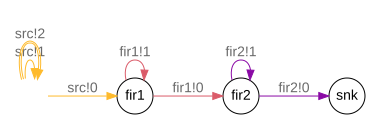

In [34]:
G_casc_1564_float = get_casc_1564_float()
G = G_casc_1564_float
G.build(); 
G.plot_graph()

#### Design choices

All the design choices for initializations of edges are exactly of the same analysis of previous one. Please refer to section 5.3.2.1.

Now, we can use `basic_view` to check the rate of the output edge (simulate for $T$, then select `rates` in `view` below). We can see that the output rate is first lifted to 47.2 *kHz*, then 48 *kHz*, which illustrates the vaidity initially.

In [35]:
# if you want to use this block, please first RE-RUN it.
L1, M1 = 15, 14
L2, M2 = 64, 63
basic_view(G_casc_1564_float)

Output()

## Integer implementations

For integer-precision implementation, the differences are the coefficients and the specification of `fo()` function. Other design choices like the initializations of edges are the same, so there will be no design choices sub-sections under each graph.

For the coefficients, we need to quantize them into `int` by the following function.

In [36]:
def get_int_coef(coef):
    temp = coef*(2**15)
    return temp.astype(np.int64)

And w.r.t `fo()`, we first quantize each input value to `int`, then perform a $\mathbf{div}~2^{15}$ operation to get the quotient, which is the final output value.

### Integer, monolithic, 160/147, sophisticated version

First, we set the values of $L$ and $M$, and quantize coefficients.

In [37]:
L, M = 160, 147
h_int = get_int_coef(coef_160)

Then, the integer-precision, monolithic, sophisticated scaler of $L=160$ and $M=147$ is inplemented in `G_mono_int`.

In [38]:
def get_mono_int(input='mp3'):
    G = Graph(rate=48000); 
    G.src = specify_input(input)

    G.fir = Node(I=[G.src, 1], fo= [lambda x: np.int16(np.int64(sum([h_int[j*L+((x[1]*M)%L)]*np.int64(x[0][4-j-1]) for j in range(4)]))//(2**15)), 
                                    lambda x: x[1]+1 if x[1] < (L-1) else 0])

    G.fir.I[0].init(x=[0, 0, 0, 0])
    G.fir.I[1].init(D=1, x=[0])

    G.fir = specify_fsm(G.fir, 160, 147)

    G.snk = Node(I=G.fir.O[0])
    return G

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_mono_int (Graph): no errors


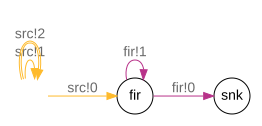

In [39]:
G_mono_int = get_mono_int()
G = G_mono_int
G.build(); 
G.plot_graph()

Now, we can use `basic_view` to check the rate of the output edge (simulate for $T$, then select `rates` in `view` below). We can see that the output signal is of rate 48 kHz, which illustrates the vaidity initially.

In [40]:
# if you want to use this block, please first RE-RUN it.
L, M = 160, 147
basic_view(G_mono_int)

Output()

### Integer, cascades,  64/63  then  15/14 , sophisticated version

First, we set the parameters for the first and second components, and quantize corresponding coefficients.

In [41]:
L1, M1 = 64, 63
h1_64_int = get_int_coef(coef_64)
L2, M2 = 15, 14
h2_15_int = get_int_coef(coef_15)

Then, the integer-precision, cascade, sophisticated scaler of $L_1=64$, $M_1=63$ and $L_2=15$, $M_2=14$ is inplemented in `G_casc_6415_int`.

In [42]:
def get_casc_6415_int(input='mp3'):
    G = Graph(rate=48000); 
    G.src = specify_input(input)

    G.fir1 = Node(I=[G.src, 1], fo= [lambda x: np.int16(np.int64(sum([h1_64_int[j*L1+((x[1]*M1)%L1)]*np.int64(x[0][4-j-1]) for j in range(4)]))//(2**15)), 
                                    lambda x: x[1]+1 if x[1] < (L1-1) else 0])
    G.fir2 = Node(I=[G.fir1.O[0], 1], fo= [lambda x: np.int16(np.int64(sum([h2_15_int[j*L2+((x[1]*M2)%L2)]*np.int64(x[0][4-j-1]) for j in range(4)]))//(2**15)),
                                           lambda x: x[1]+1 if x[1] < (L2-1) else 0])

    G.fir1.I[0].init(x=[0, 0, 0, 0])
    G.fir1.I[1].init(D=1, x=[0])
    G.fir2.I[0].init(x=[0, 0, 0, 0])
    G.fir2.I[1].init(D=1, x=[0])

    G.fir1 = specify_fsm(G.fir1, 64, 63)
    G.fir2 = specify_fsm(G.fir2, 15, 14)

    G.snk = Node(I=G.fir2.O[0])
    return G

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_6415_int (Graph): no errors


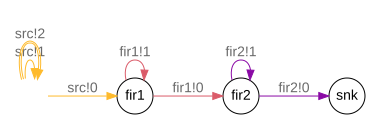

In [43]:
G_casc_6415_int = get_casc_6415_int() 
G = G_casc_6415_int
G.build(); 
G.plot_graph()

Now, we can use `basic_view` to check the rate of the output edge (simulate for $T$, then select `rates` in `view` below). We can see that the rate of output signal is first lifted up to 44.8 *kHz*, then 48 *kHz*, which illustrates the vaidity initially.

In [44]:
# if you want to use this block, please first RE-RUN it.
L1, M1 = 64, 63
L2, M2 = 15, 14
basic_view(G_casc_6415_int)

Output()

### Cascades, 15/14 then 64/63, sophisticated

First, we set the parameters for the first and second components, and quantize corresponding coefficients.

In [45]:
L1, M1 = 15, 14
h1_15_int = get_int_coef(coef_15)
L2, M2 = 64, 63
h2_64_int = get_int_coef(coef_64)

Then, the integer-precision, cascade, sophisticated scaler of $L_1=15$, $M_1=14$ and $L_2=64$, $M_2=63$ is inplemented in `G_casc_1564_int`.

In [46]:
def get_casc_1564_int(input='mp3'):
    G = Graph(rate=48000);
    G.src = specify_input(input)

    G.fir1 = Node(I=[G.src, 1], fo= [lambda x: np.int16(np.int64(sum([h1_15_int[j*L1+((x[1]*M1)%L1)]*np.int64(x[0][4-j-1]) for j in range(4)]))//(2**15)), 
                                    lambda x: x[1]+1 if x[1] < (L1-1) else 0])
    G.fir2 = Node(I=[G.fir1.O[0], 1], fo= [lambda x: np.int16(np.int64(sum([h2_64_int[j*L2+((x[1]*M2)%L2)]*np.int64(x[0][4-j-1]) for j in range(4)]))//(2**15)),
                                           lambda x: x[1]+1 if x[1] < (L2-1) else 0])

    G.fir1.I[0].init(x=[0, 0, 0, 0])
    G.fir1.I[1].init(D=1, x=[0])
    G.fir2.I[0].init(x=[0, 0, 0, 0])
    G.fir2.I[1].init(D=1, x=[0])

    G.fir1 = specify_fsm(G.fir1, 15, 14)
    G.fir2 = specify_fsm(G.fir2, 64, 63)

    G.snk = Node(I=G.fir2.O[0])
    return G

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_1564_int (Graph): no errors


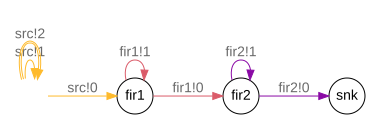

In [47]:
G_casc_1564_int = get_casc_1564_int()
G = G_casc_1564_int
G.build(); 
G.plot_graph()

Now, we can use `basic_view` to check the rate of the output edge (simulate for $T$, then select `rates` in `view` below). We can see that the output rate is first lifted to 47.2 *kHz*, then 48 *kHz*, which illustrates the vaidity initially.

In [48]:
# if you want to use this block, please first RE-RUN it.
L1, M1 = 15, 14
L2, M2 = 64, 63
basic_view(G_casc_1564_int)

Output()

## Overflow is impossible to avoid? Yes. Because of the existance of negative coefficients

We try to answer this in this section. Overshoot (overflow here) is the occurrence of a signal or function exceeding its target, which especially happens in the step response of bandlimited systems, for example, the low-pass filters here are typical examples [[3]](#3). There are negative coefficients within the `lanczos2(t)` according to the figures in task 1 above, so the output values are the results of *affine combinations* rather than *convex combinations* (if all coefficients are positive), which leads to the fact that after linear combinations, the output results may fall outside the desired range [[4]](#4). 

# Simulation and verification

Simulate all your designs and verify them using a reference solution of your own choosing. As reference input you may want to consider a block_wave, but you are free to choose your own input. Also simulate a couple of seconds from a proper audio stream. Remember to keep your simulations restricted to a  few seconds (given correct and efficient solutions, simulating for 5 seconds real-time should be feasible, but start with a smaller duration). In particular, create periodograms of your output streams and explain them. See the guidelines notebook $\mathtt{~𝚐𝚞𝚒𝚍𝚎𝚕𝚒𝚗𝚎𝚜.𝚒𝚙𝚢𝚗𝚋~}$ for further instructions on what to report.

<center><font color=blue size="5">
Insert your simulation data and conclusion here.
</font></center>

In the previous chapter, we have build an auxiliary function to generate block waves. Here we will describe this reference signal in detail. The generation of block waves are specified by three parameters, namely `block_len`, `rate` and `t`, where `block_len` is used to control the length of the block, `rate` is the frequency of the generated wave, and `t` controls the duration. For instance, we can observe the following code block, which specifies a block wave whose duration is 2 *s*, rate is 44.1 *kHz*, and block length is 500. Obviously, the period of the block is $44.1Hz = 500*2/44100$. Using this function, we can generate the block wave we want, and plug in the graphs to perform simulations and verifications. `specify_input()` method defined above will be used to control the input signal. 

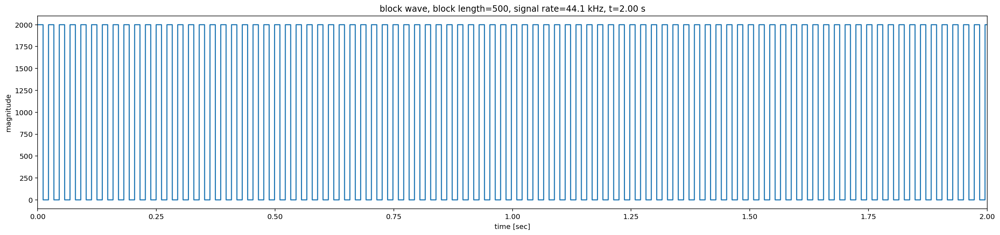

In [49]:
_ = generate_block_wave(500, 44100, t=2, plot=True)

In [50]:
def basic_simulation(G, cascade=False):
    G.reset()
    G.sim(T=5)
    if cascade:
        edges_concern=[G.fir1.I[0], G.fir2.O[0]]
    else:
        edges_concern=[G.fir.I[0], G.fir.O[0]]
    G.plot_data(tmin=0.62, tmax=0.64, Edges=edges_concern);
    G.plot_periodogram(Edges=edges_concern);
    if cascade:
        print('\n Sample rate of {0:s}:\t input: {1:3.1f} kHz \t output: {2:3.1f} kHz'.format(G.name, G.fir1.I[0].rate()/1000, G.fir2.O[0].rate()/1000))
    else:
        print('\n Sample rate of {0:s}:\t input: {1:3.1f} kHz \t output: {2:3.1f} kHz'.format(G.name, G.fir.I[0].rate()/1000, G.fir.O[0].rate()/1000))

## Simulation and verification based on a block wave

For every design, we build corresponding graphs that use the block wave as the input signal, where `block_len=50`, `rate=44.1 kHz` and `t=5`. And such block waves will be our reference input. For each graph, we provide both time (by `plot_data()`) and frequency (by `plot_periodogram()`) domain comparisons to verify the correctness.

### Simulation and verification on float, monolithic, 160/147, sophisticated version

G_mono_float (Graph): no errors


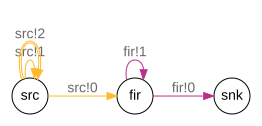

In [51]:
G_mono_float = get_mono_float(input='block_wave')
G = G_mono_float
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     200   4.167ms      0.0s       764  lasso=2(160)*, real time
  114200     2.38s     10.0s    438240  
  228700     4.76s     20.0s    877634  
  240000     5.00s     21.6s    920998  pause (43ke/cs)

 Sample rate of G_mono_float:	 input: 44.1 kHz 	 output: 48.0 kHz


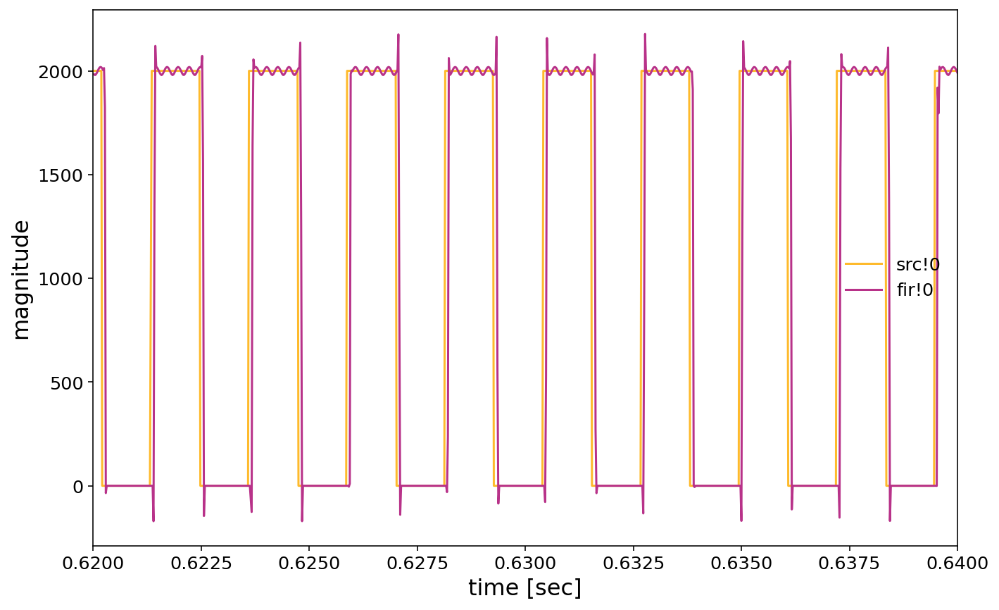

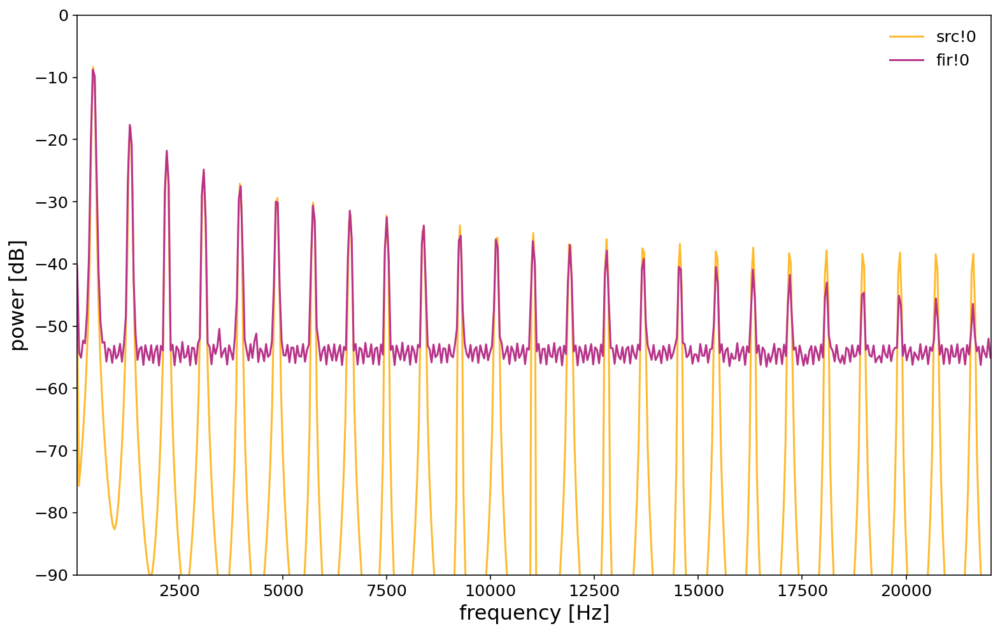

In [52]:
L, M = 160, 147
basic_simulation(G_mono_float, cascade=False)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, monolithic, 160/147 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, but is quite short. 
- When sampling the signal around the magnitude changes (0 to 2000 or 2000 to 1), relatively big fluctuation can be observed. Also, the absolute values of the resampled signal around these regions always exceed the origin range (0 to 2000). We can also observe that when sampling values at high level (2000 here), fluctuations within a small range always happens. 

    - These phenomenons are introduced by the low-pass FIR filter powered by `lanczos2(t)`. Concretely, there are negative coefficients conducing *affine combinations*, making overflow possible. In this sense, block waves are *golden* reference signals for this system. The reason why there are no such fluctuation at the low level is that the magnitude here is 0, so after the window completely leaves the high level area, the fluctuation disappears due to multiplication between 0 and coefficients.

- Finally, the shape of the resampled signal fits the origin block wave, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that 

- the power of frequncies that are of high power in the original signal remain largely, which proves the correctness of our system to some extent. 
- But apparently, power appears at frequencies where there is no power in the original signal. These power are mainly introduced from the low-pass filter powered by `lanczos2(t)`. The fluctuations observed in the time domain is exactly the source of these power. 
- And the power supposed to be of high frequencies are shared to the frequencies where there is no power in the original block wave. So the peaks (power) of multiple frequency of the block wave are less and less. 

### Simulation and verification on float, cascades, 64/63 then 15/14, sophisticated version

G_casc_6415_float (Graph): no errors


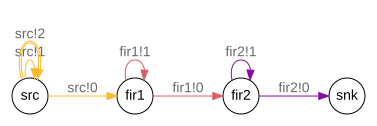

In [53]:
G_casc_6415_float = get_casc_6415_float(input='block_wave')
G = G_casc_6415_float
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     500  10.417ms      0.2s      2842  lasso=3(480)*, real time
   89800     1.87s     10.2s    512226  
  187400     3.90s     20.2s   1068952  
  240000     5.00s     25.6s   1368994  pause (53ke/cs)

 Sample rate of G_casc_6415_float:	 input: 44.1 kHz 	 output: 48.0 kHz


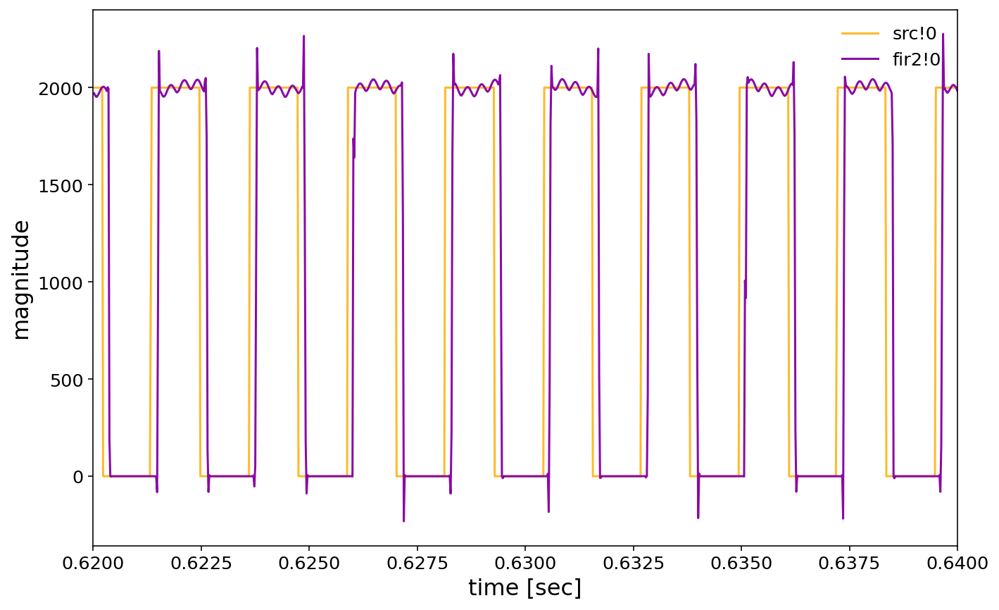

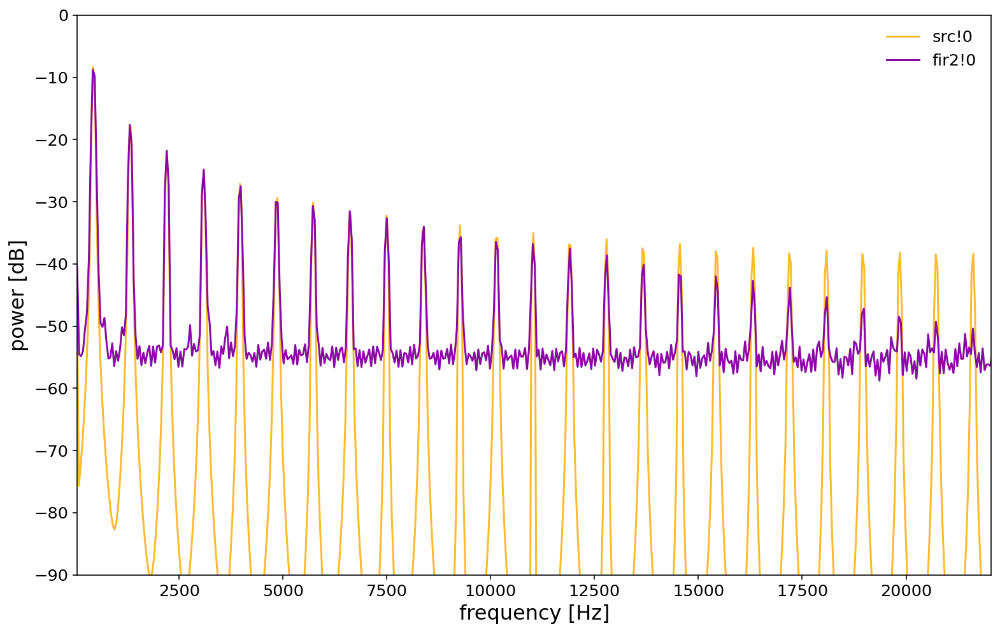

In [54]:
L1, M1 = 64, 63
L2, M2 = 15, 14
basic_simulation(G_casc_6415_float, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, cascade, 64/63 then 15/14 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and it is obviously longer than monolithic version.

    - Because cascade version design is equivalent to make the signal pass the filter twice. So there is longer latency.

- When sampling the signal around the magnitude changes (0 to 2000 or 2000 to 1), relatively big fluctuation can be observed. Also, the absolute values of the resampled signal around these regions always exceed the origin range (0 to 2000). We can also observe that when sampling values at high level (2000 here), fluctuations within a small range always happens. 

    - The corresponding reasons are explained before. Please refer to section 6.1.1.

- Finally, the shape of the resampled signal fits the origin block wave, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that 

- the power of frequncies that are of high power in the original signal remain largely, which proves the correctness of our system to some extent. 
- But apparently, power appears at frequencies where there is no power in the original signal. These power are mainly introduced from the low-pass filter powered by `lanczos2(t)`. The fluctuations observed in the time domain is exactly the source of these power. 
- And the power supposed to be of high frequencies are shared to the frequencies where there is no power in the original block wave. So the peaks (power) of multiple frequency of the block wave are less and less.

### Simulation and verification on float, cascades, 15/14 then 64/63, sophisticated version

G_casc_1564_float (Graph): no errors


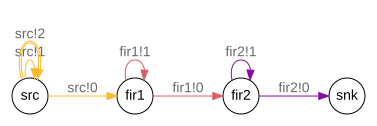

In [55]:
G_casc_1564_float = get_casc_1564_float(input='block_wave')
G = G_casc_1564_float
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     400   8.333ms      0.1s      2312  lasso=3(320)*, real time
   95000     1.98s     10.1s    551584  
  191600     3.99s     20.1s   1112470  
  240000     5.00s     25.2s   1393494  pause (55ke/cs)

 Sample rate of G_casc_1564_float:	 input: 44.1 kHz 	 output: 48.0 kHz


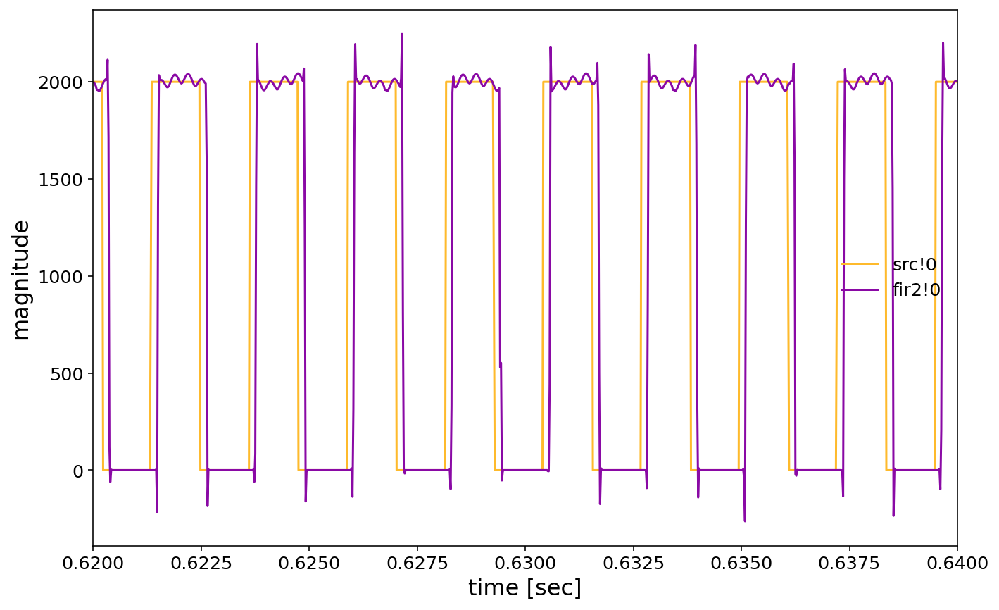

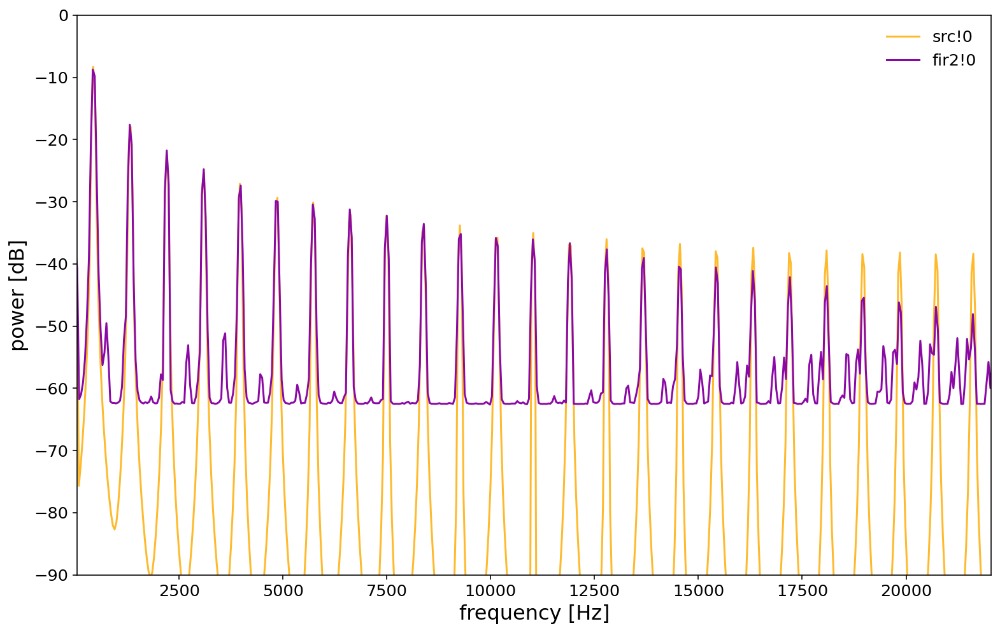

In [56]:
L1, M1 = 15, 14
L2, M2 = 64, 63
basic_simulation(G_casc_1564_float, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, cascade, 15/14 then 64/63 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and it is obviously longer than monolithic version.

    - The corresponding reasons are explained before. Please refer to section 6.1.2.

- When sampling the signal around the magnitude changes (0 to 2000 or 2000 to 1), relatively big fluctuation can be observed. Also, the absolute values of the resampled signal around these regions always exceed the origin range (0 to 2000). We can also observe that when sampling values at high level (2000 here), fluctuations within a small range always happens. 

    - The corresponding reasons are explained before. Please refer to section 6.1.1.

- Finally, the shape of the resampled signal fits the origin block wave, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that 

- the power of frequncies that are of high power in the original signal remain largely, which proves the correctness of our system to some extent. 
- But apparently, power appears at frequencies where there is no power in the original signal. These power are mainly introduced from the low-pass filter powered by `lanczos2(t)`. The fluctuations observed in the time domain is exactly the source of these power. **Additionally**, the power spectum density from 5 *kHz* to 12.5 *kHz* within these frequncies is much flatter than the (64/63, then 15/14) version. Whereas the PSD in other range fluctuates much more than the (64/63, then 15/14) version.
- And the power supposed to be of high frequencies are shared to the frequencies where there is no power in the original block wave. So the peaks (power) of multiple frequency of the block wave are less and less.

### Simulation and verification on integer, monolithic, 160/147, sophisticated version

G_mono_int (Graph): no errors


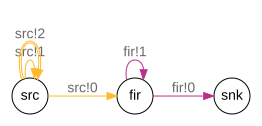

In [57]:
G_mono_int = get_mono_int(input='block_wave')
G = G_mono_int
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     200   4.167ms      0.0s       764  lasso=2(160)*, real time
  118700     2.47s     10.0s    455508  
  238400     4.97s     20.0s    914858  
  240000     5.00s     20.1s    920998  pause (46ke/cs)

 Sample rate of G_mono_int:	 input: 44.1 kHz 	 output: 48.0 kHz


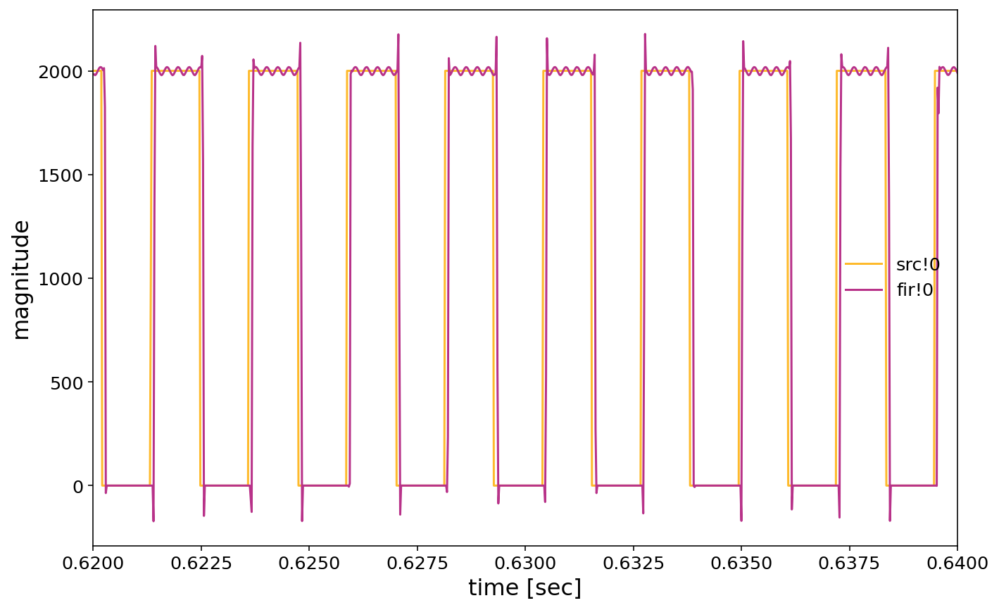

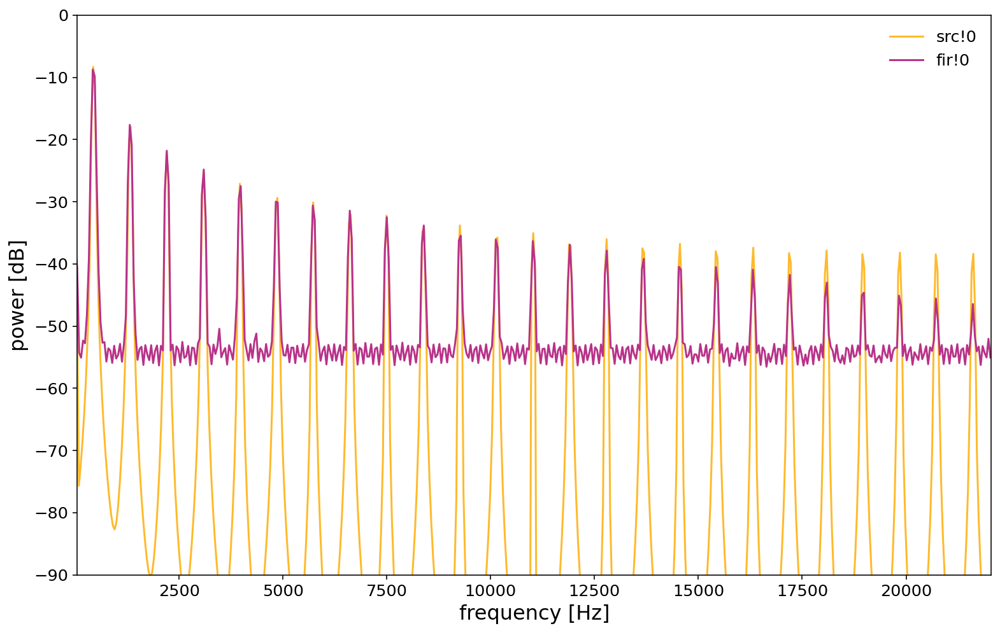

In [58]:
L, M = 160, 147
basic_simulation(G_mono_int)

The time and frequency domain comparisons between the origin block wave and resampled wave of integer, monolithic, 160/147 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, but is quite short. 
    - This is consistent to the float version
- When sampling the signal around the magnitude changes (0 to 2000 or 2000 to 1), relatively big fluctuation can be observed. Also, the absolute values of the resampled signal around these regions always exceed the origin range (0 to 2000). We can also observe that when sampling values at high level (2000 here), fluctuations within a small range always happens. 

    - These phenomenons are explained in section 6.1.1.

- Finally, the shape of the resampled signal fits the origin block wave, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that 

- the power of frequncies that are of high power in the original signal remain largely, which proves the correctness of our system to some extent. 
- But apparently, power appears at frequencies where there is no power in the original signal. These power are mainly introduced from the low-pass filter powered by `lanczos2(t)`. The fluctuations observed in the time domain is exactly the source of these power. 
- And the power supposed to be of high frequencies are shared to the frequencies where there is no power in the original block wave. So the peaks (power) of multiple frequency of the block wave are less and less. 

Meanwhile, we actually cannot see the difference between the integer and float versions. If there are no noticable dierences in actual use (audio simulations later), all integer version will be the better choice, since it costs less memory and shorter computation time. 

### Simulation and verification on integer, cascades, 64/63 then 15/14, sophisticated version

G_casc_6415_int (Graph): no errors


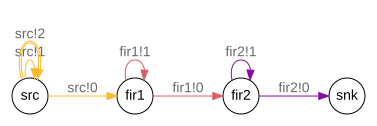

In [59]:
G_casc_6415_int = get_casc_6415_int(input='block_wave')
G = G_casc_6415_int
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     500  10.417ms      0.2s      2842  lasso=3(480)*, real time
   88400     1.84s     10.2s    504238  
  176100     3.67s     20.2s   1004496  
  240000     5.00s     27.4s   1368994  pause (50ke/cs)

 Sample rate of G_casc_6415_int:	 input: 44.1 kHz 	 output: 48.0 kHz


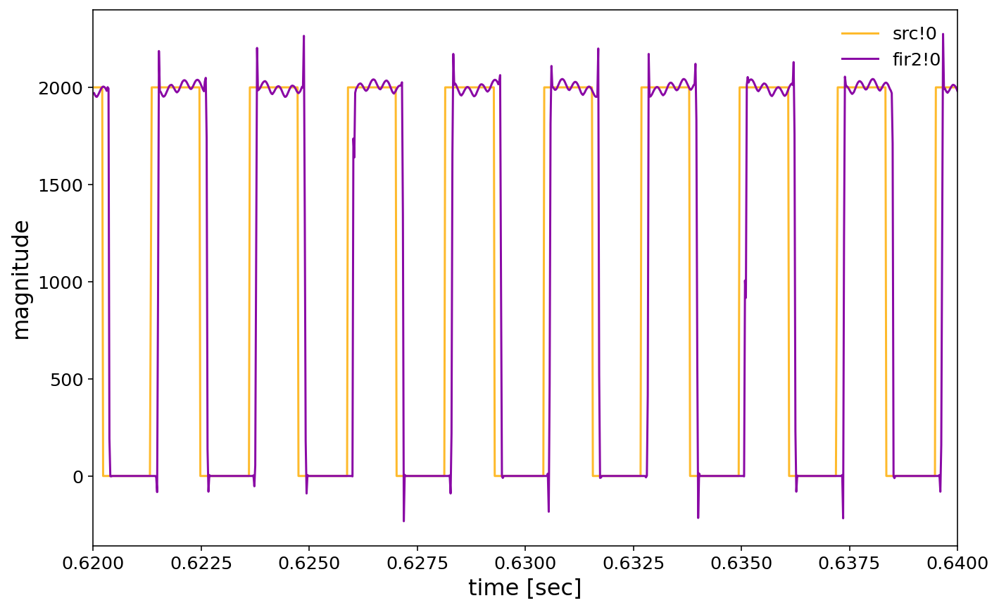

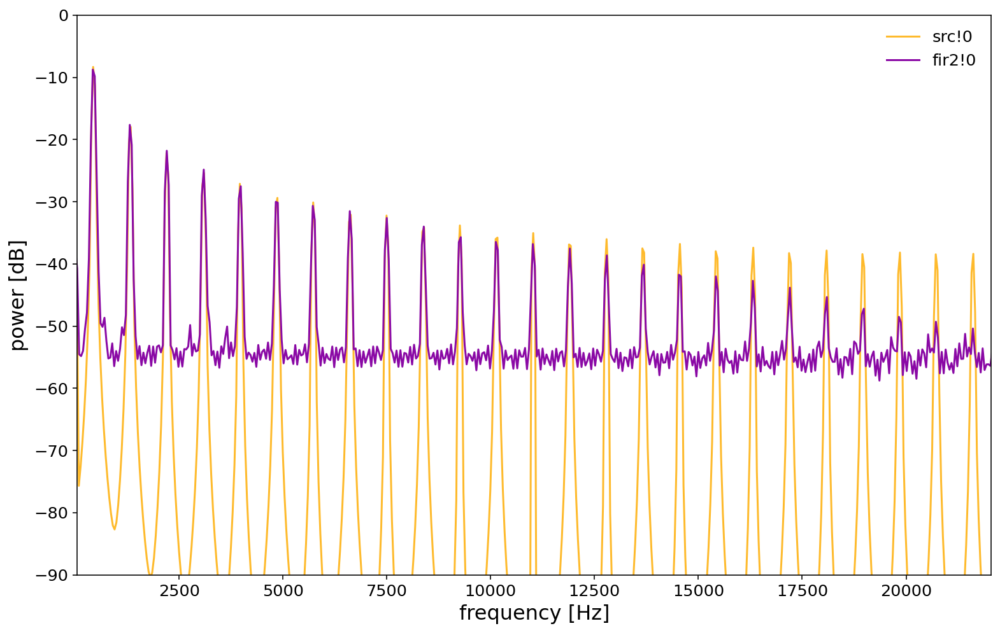

In [60]:
L1, M1 = 64, 63
L2, M2 = 15, 14
basic_simulation(G_casc_6415_int, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, cascade, 64/63 then 15/14 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and it is obviously longer than monolithic version.

    - Explained in section 6.1.2

- When sampling the signal around the magnitude changes (0 to 2000 or 2000 to 1), relatively big fluctuation can be observed. Also, the absolute values of the resampled signal around these regions always exceed the origin range (0 to 2000). We can also observe that when sampling values at high level (2000 here), fluctuations within a small range always happens. 

    - Explained section 6.1.1.

- Finally, the shape of the resampled signal fits the origin block wave, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that 

- the power of frequncies that are of high power in the original signal remain largely, which proves the correctness of our system to some extent. 
- But apparently, power appears at frequencies where there is no power in the original signal. These power are mainly introduced from the low-pass filter powered by `lanczos2(t)`. The fluctuations observed in the time domain is exactly the source of these power. 
- And the power supposed to be of high frequencies are shared to the frequencies where there is no power in the original block wave. So the peaks (power) of multiple frequency of the block wave are less and less.

Meanwhile, we actually cannot see the difference between the integer and float versions. If there are no noticable dierences in actual use (audio simulations later), all integer version will be the better choice, since it costs less memory and shorter computation time. 

### Simulation and verification on integer, cascades, 15/14 then 64/63, sophisticated version

G_casc_1564_int (Graph): no errors


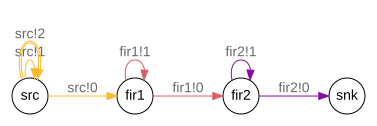

In [61]:
G_casc_1564_int = get_casc_1564_int(input='block_wave')
G = G_casc_1564_int
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     400   8.333ms      0.2s      2312  lasso=3(320)*, real time
   87900     1.83s     10.2s    510360  
  176700     3.68s     20.2s   1025958  
  240000     5.00s     27.3s   1393494  pause (51ke/cs)

 Sample rate of G_casc_1564_int:	 input: 44.1 kHz 	 output: 48.0 kHz


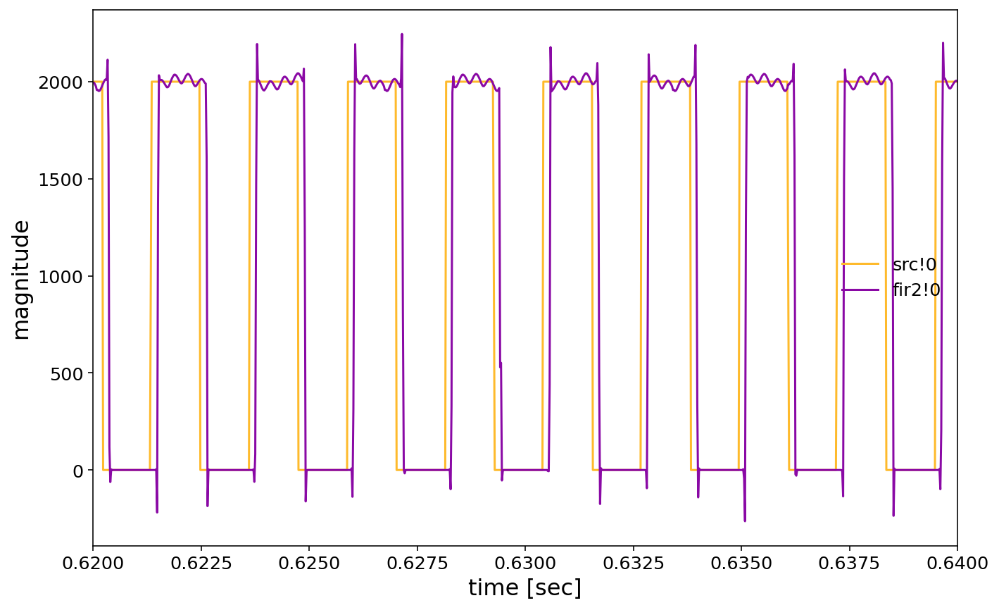

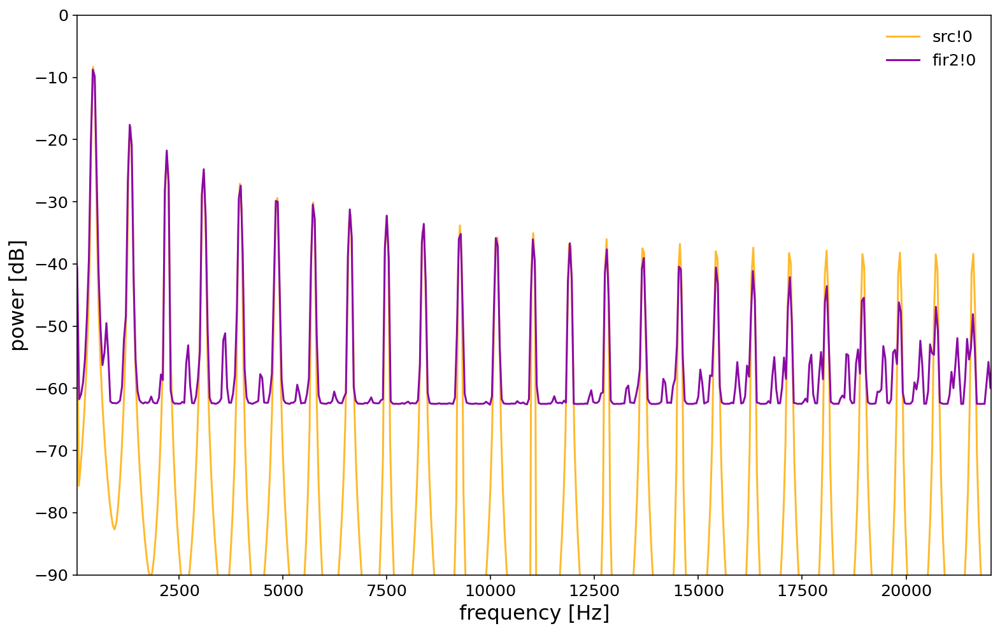

In [62]:
L1, M1 = 15, 14
L2, M2 = 64, 63
basic_simulation(G_casc_1564_int, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, cascade, 15/14 then 64/63 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and it is obviously longer than monolithic version.

    - The corresponding reasons are explained before. Please refer to section 6.1.2.

- When sampling the signal around the magnitude changes (0 to 2000 or 2000 to 1), relatively big fluctuation can be observed. Also, the absolute values of the resampled signal around these regions always exceed the origin range (0 to 2000). We can also observe that when sampling values at high level (2000 here), fluctuations within a small range always happens. 

    - The corresponding reasons are explained before. Please refer to section 6.1.1.

- Finally, the shape of the resampled signal fits the origin block wave, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that 

- the power of frequncies that are of high power in the original signal remain largely, which proves the correctness of our system to some extent. 
- But apparently, power appears at frequencies where there is no power in the original signal. These power are mainly introduced from the low-pass filter powered by `lanczos2(t)`. The fluctuations observed in the time domain is exactly the source of these power. **Additionally**, the power spectum density from 5 *kHz* to 12.5 *kHz* within these frequncies is much flatter than the (64/63, then 15/14) version. Whereas the PSD in other range fluctuates much more than the (64/63, then 15/14) version.
- And the power supposed to be of high frequencies are shared to the frequencies where there is no power in the original block wave. So the peaks (power) of multiple frequency of the block wave are less and less.

Meanwhile, we actually cannot see the difference between the integer and float versions. If there are no noticable dierences in actual use (audio simulations later), all integer version will be the better choice, since it costs less memory and shorter computation time. 

## Simulation and verification based on the audio

We have observed that `lanczos2(t)` introduces fluctuation then conduces possible overflow. All graphs have been proven that can get desired output rate (48 *kHz*). The most valuable discovery is the performances of integer versions. To further check the performance of integer designs, using the same method, we change the input signal to audio, then perform the same simulations.

### Simulation and verification on float, monolithic, 160/147, sophisticated version

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_mono_float (Graph): no errors


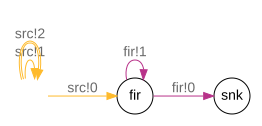

In [63]:
G_mono_float = get_mono_float(input='mp3')
G = G_mono_float
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     200   4.167ms      0.0s       764  lasso=2(160)*, real time
  110600     2.30s     10.0s    424424  
  228100     4.75s     20.0s    875332  
  240000     5.00s     21.3s    920998  pause (43ke/cs)

 Sample rate of G_mono_float:	 input: 44.1 kHz 	 output: 48.0 kHz


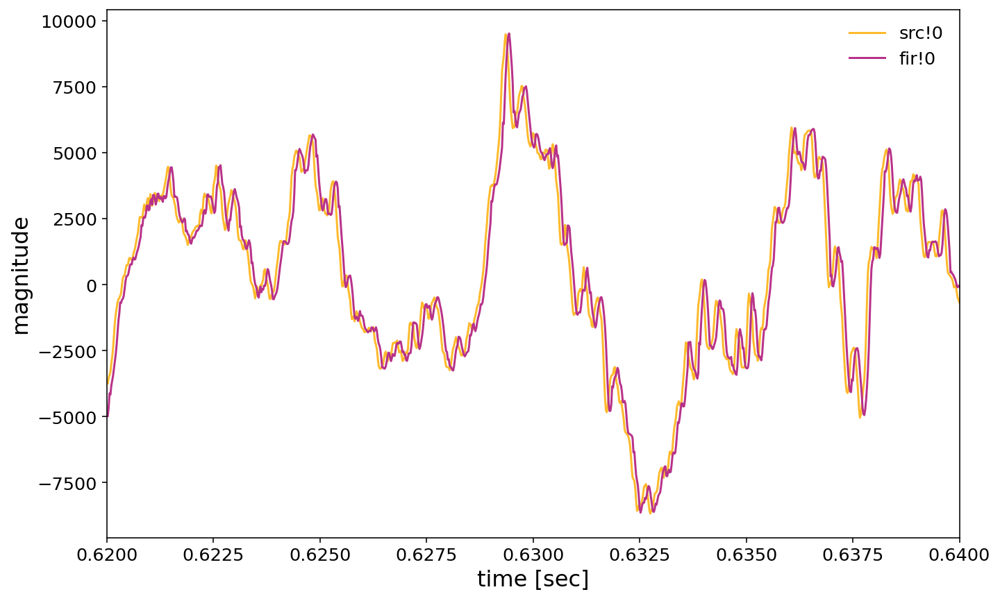

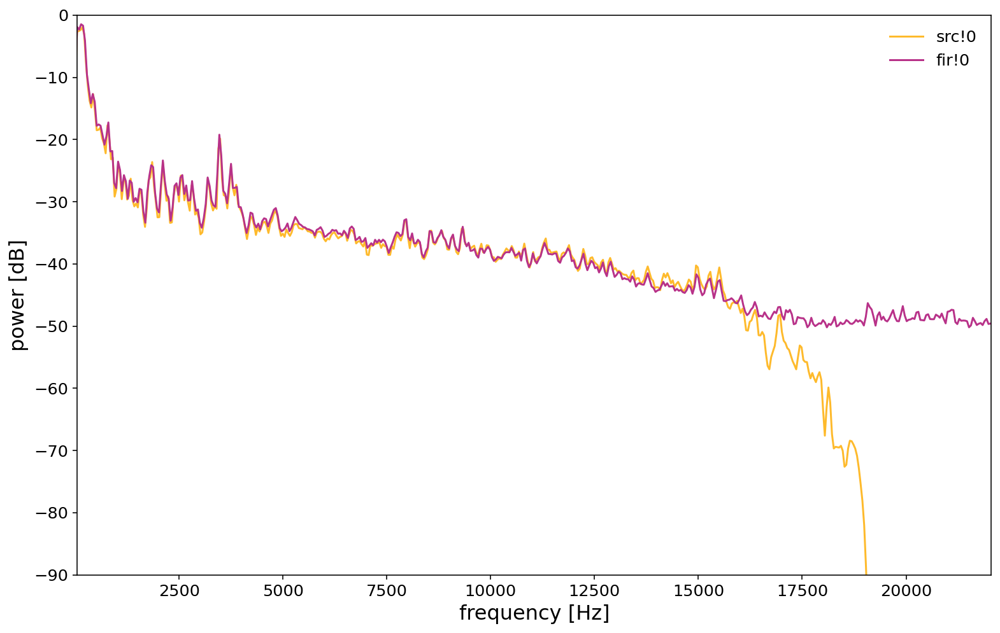

In [64]:
L, M = 160, 147
basic_simulation(G_mono_float, cascade=False)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, monolithic, 160/147 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, but is quite short.

    - This is consistent to the simulation results using block wave. 
    
- The shape of the resampled signal fits the origin audio, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that

- When the frequncy is less than around 16 *kHz*, the PSD of the origin audio are largely kept.

    - This demonstrates the correctness of this system. We can derive that the resampled audio will sound the same as the original one.

- But the power of frequencies higher than around 16 *kHz* are much more higher than before. 

    - This phenomenon is consistent to the behavior of `lanczos2(t)`. The negative coefficients introduce unexpected fluctuations and overflow, which enlarges the power of high frequencies. 

We can listen to the original and re-sampled audio. And there are actually no significant differences, which is consistent to the frequency domain comparison results, and proves the feasibility of this graph. 

In [65]:
G.fir.I[0].play_data()

src!0 : rate= 44.1kHz


In [66]:
G.snk.I[0].play_data()

fir!0 : rate= 48.0kHz


### Simulation and verification on float, cascades, 64/63 then 15/14, sophisticated version

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_6415_float (Graph): no errors


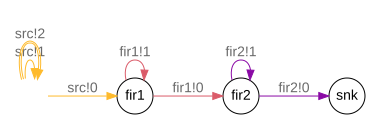

In [67]:
G_casc_6415_float = get_casc_6415_float(input='mp3')
G = G_casc_6415_float
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     500  10.417ms      0.2s      2842  lasso=3(480)*, real time
   87800     1.83s     10.2s    500816  
  178400     3.72s     20.2s   1017614  
  240000     5.00s     27.6s   1368994  pause (50ke/cs)

 Sample rate of G_casc_6415_float:	 input: 44.1 kHz 	 output: 48.0 kHz


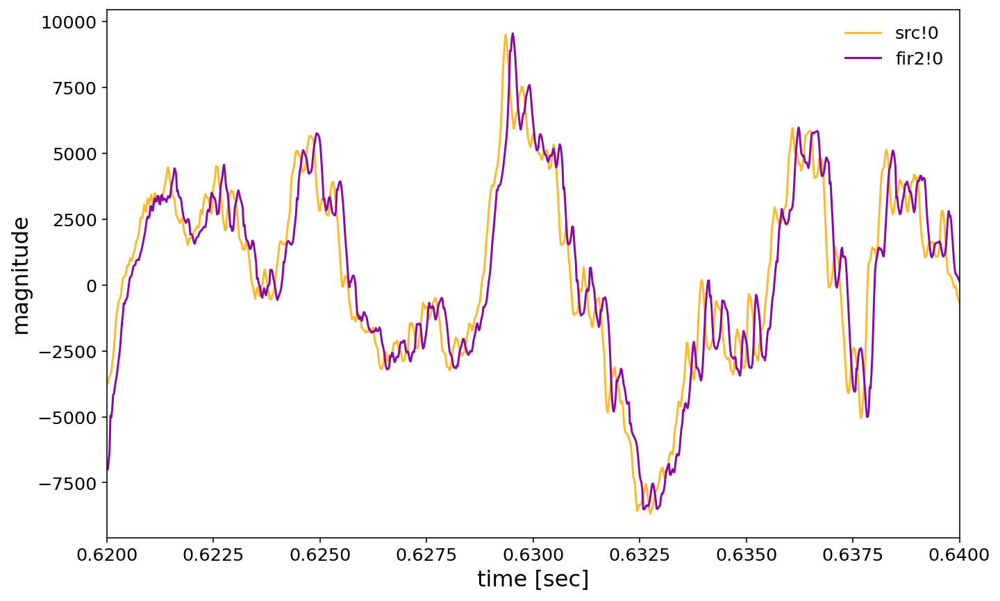

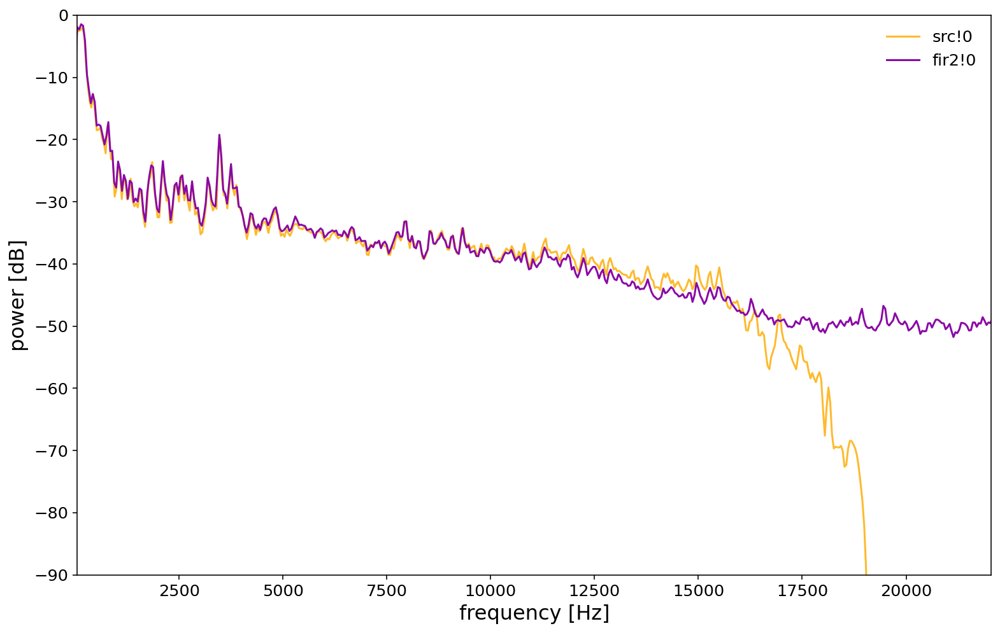

In [68]:
L1, M1 = 64, 63
L2, M2 = 15, 14
basic_simulation(G_casc_6415_float, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, cascade, 64/63 then 15/14 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and is longer than the monolithic design.

    - This is consistent to the simulation results using block wave. 
    
- The shape of the resampled signal fits the origin audio, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that

- When the frequncy is less than around 16 *kHz*, the PSD of the origin audio are largely kept.

    - This demonstrates the correctness of this system. We can derive that the resampled audio will sound the same as the original one.

- But the power of frequencies higher than around 16 *kHz* are much more higher than before. 

    - This phenomenon is consistent to the behavior of `lanczos2(t)`. The negative coefficients introduce unexpected fluctuations and overflow, which enlarges the power of high frequencies. 

We can listen to the original and re-sampled audio. And there are actually no significant differences, which is consistent to the frequency domain comparison results, and proves the feasibility of this graph. 

In [69]:
G.fir1.I[0].play_data()

src!0 : rate= 44.1kHz


In [70]:
G.snk.I[0].play_data()

fir2!0 : rate= 48.0kHz


### Simulation and verification on float, cascades, 15/14 then 64/63, sophisticated version

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_1564_float (Graph): no errors


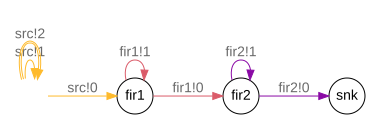

In [71]:
G_casc_1564_float = get_casc_1564_float(input='mp3')
G = G_casc_1564_float
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     400   8.333ms      0.2s      2312  lasso=3(320)*, real time
   81000     1.69s     10.2s    470298  
  163000     3.40s     20.2s    946412  
  240000     5.00s     29.0s   1393494  pause (48ke/cs)

 Sample rate of G_casc_1564_float:	 input: 44.1 kHz 	 output: 48.0 kHz


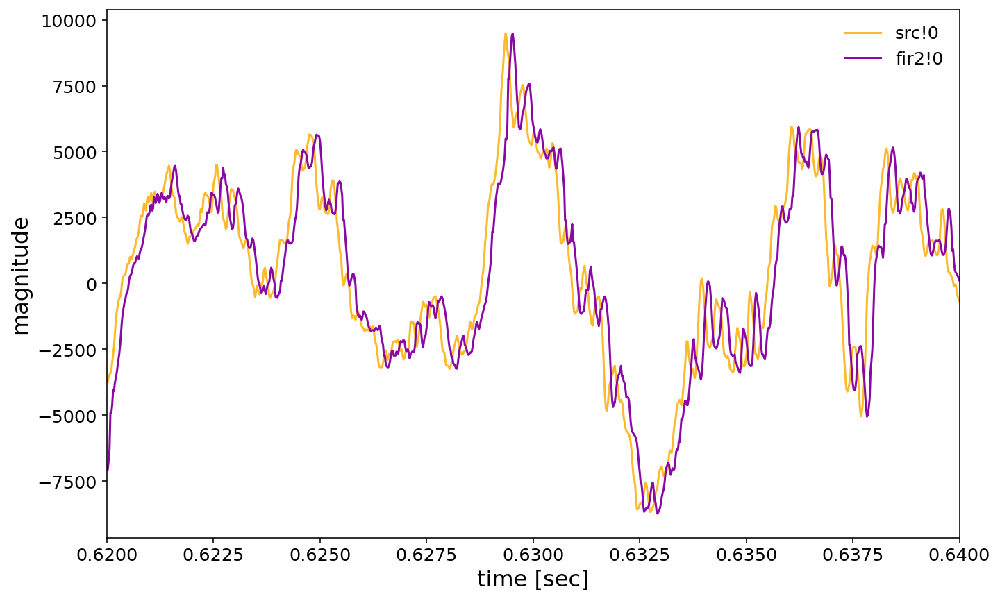

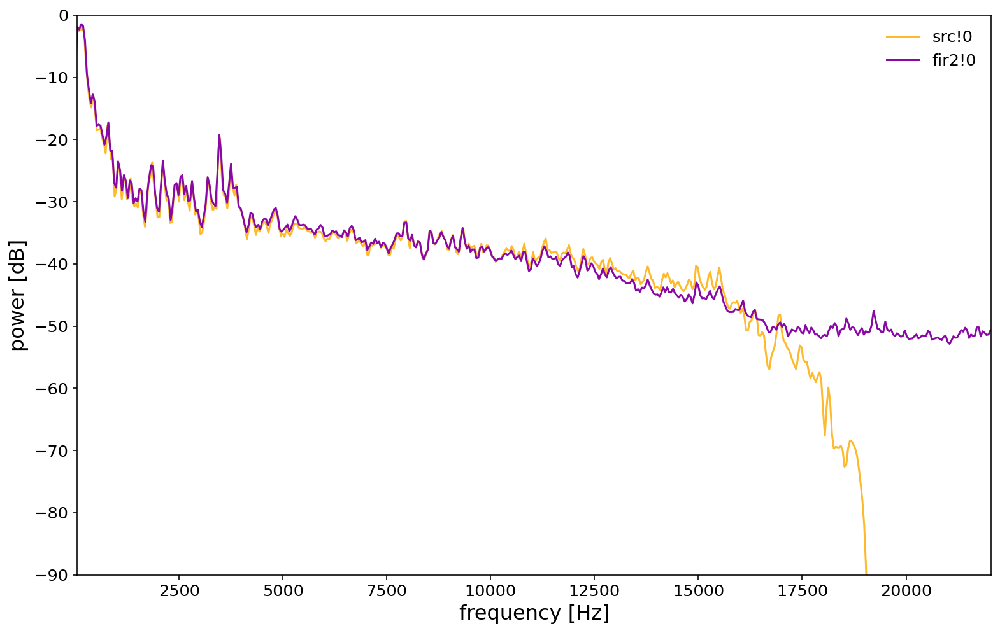

In [72]:
L1, M1 = 15, 14
L2, M2 = 64, 63
basic_simulation(G_casc_1564_float, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of float, cascade, 15/14 then 64/63 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and is longer than the monolithic design.

    - This is consistent to the simulation results using block wave. 
    
- The shape of the resampled signal fits the origin audio, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that

- When the frequncy is less than around 16 *kHz*, the PSD of the origin audio are largely kept.

    - This demonstrates the correctness of this system. We can derive that the resampled audio will sound the same as the original one.

- But the power of frequencies higher than around 16 *kHz* are much more higher than before. 

    - This phenomenon is consistent to the behavior of `lanczos2(t)`. The negative coefficients introduce unexpected fluctuations and overflow, which enlarges the power of high frequencies. 

We can listen to the original and re-sampled audio. And there are actually no significant differences, which is consistent to the frequency domain comparison results, and proves the feasibility of this graph. 

In [73]:
G.fir1.I[0].play_data()

src!0 : rate= 44.1kHz


In [74]:
G.snk.I[0].play_data()

fir2!0 : rate= 48.0kHz


### Simulation and verification on integer, monolithic, 160/147, sophisticated version

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_mono_int (Graph): no errors


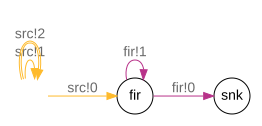

In [75]:
G_mono_int = get_mono_int(input='mp3')
G = G_mono_int
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     200   4.167ms      0.0s       764  lasso=2(160)*, real time
  105900     2.21s     10.0s    406388  
  216000     4.50s     20.0s    828898  
  240000     5.00s     23.1s    920998  pause (40ke/cs)

 Sample rate of G_mono_int:	 input: 44.1 kHz 	 output: 48.0 kHz


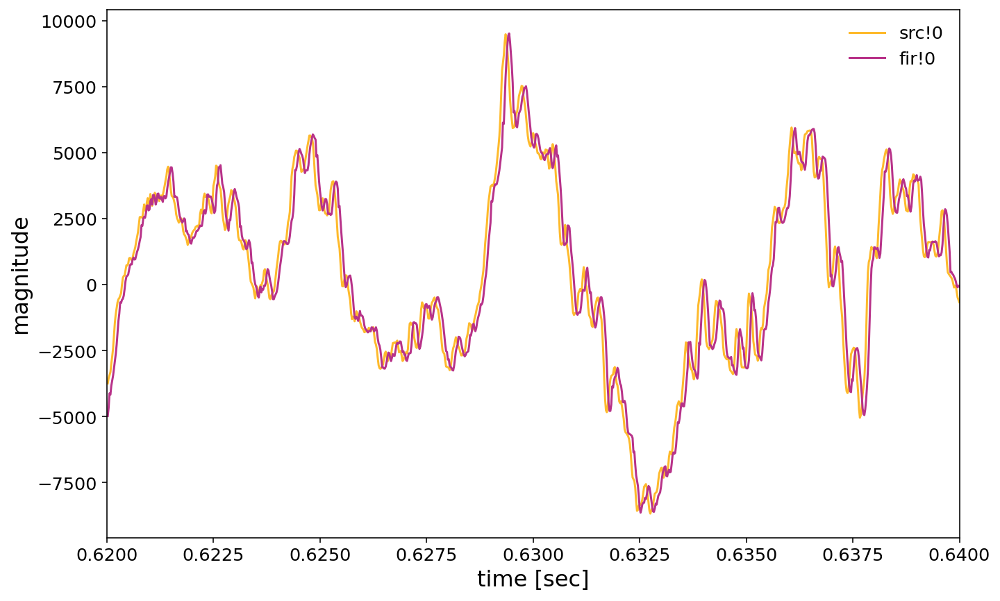

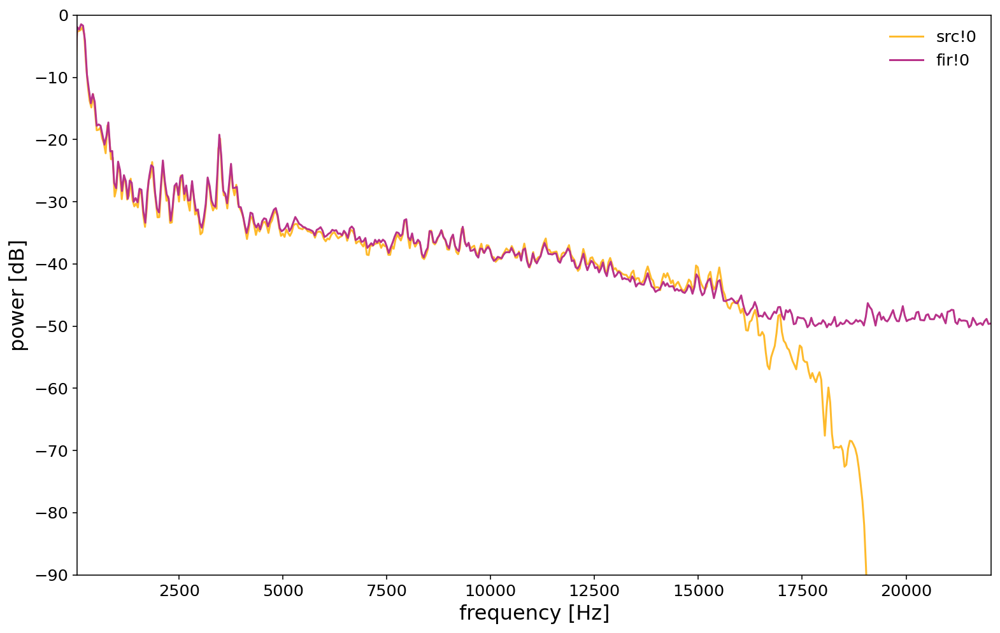

In [76]:
L, M = 160, 147
basic_simulation(G_mono_int)

The time and frequency domain comparisons between the origin block wave and resampled wave of integer, monolithic, 160/147 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, but is quite short.

    - This is consistent to the simulation results using block wave. 
    
- The shape of the resampled signal fits the origin audio, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that

- When the frequncy is less than around 16 *kHz*, the PSD of the origin audio are largely kept.

    - This demonstrates the correctness of this system. We can derive that the resampled audio will sound the same as the original one.

- But the power of frequencies higher than around 16 *kHz* are much more higher than before. 

    - This phenomenon is consistent to the behavior of `lanczos2(t)`. The negative coefficients introduce unexpected fluctuations and overflow, which enlarges the power of high frequencies. 

We can listen to the original and re-sampled audio. And there are actually no significant differences, which is consistent to the frequency domain comparison results, and proves the feasibility of this graph. **Additionally, in practical use, integer version will be the better choice**, since it costs lower resource and shorter computation time without noticeable loss of quality.

In [77]:
G.fir.I[0].play_data()

src!0 : rate= 44.1kHz


In [78]:
G.snk.I[0].play_data()

fir!0 : rate= 48.0kHz


### Simulation and verification on integer, cascades, 64/63 then 15/14, sophisticated version

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_6415_int (Graph): no errors


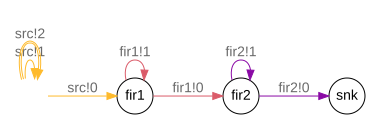

In [79]:
G_casc_6415_int = get_casc_6415_int(input='mp3')
G = G_casc_6415_int
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     500  10.417ms      0.2s      2842  lasso=3(480)*, real time
   77800     1.62s     10.2s    443776  
  158400     3.30s     20.2s    903534  
  240000     5.00s     30.2s   1368994  pause (45ke/cs)

 Sample rate of G_casc_6415_int:	 input: 44.1 kHz 	 output: 48.0 kHz


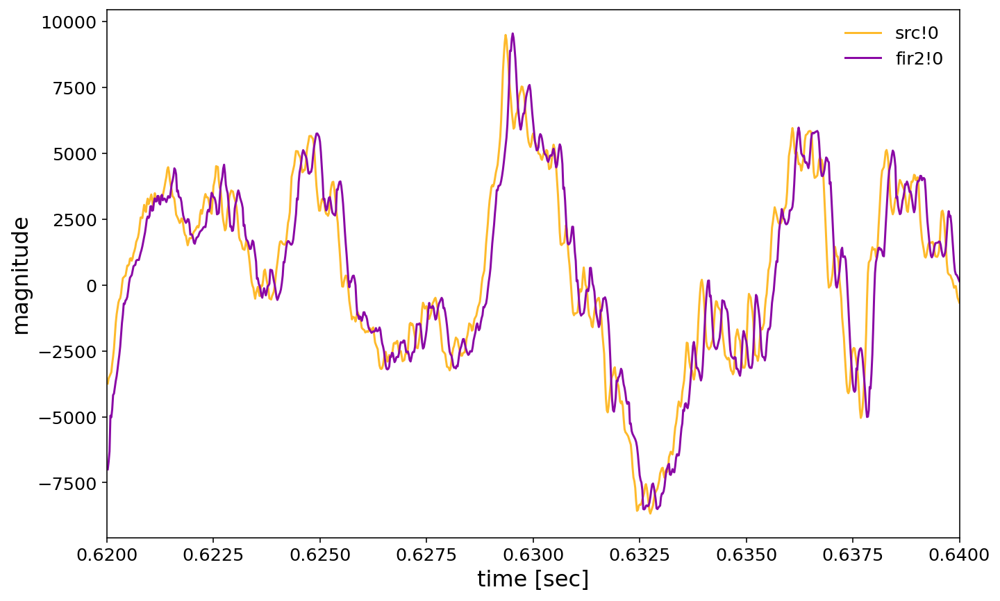

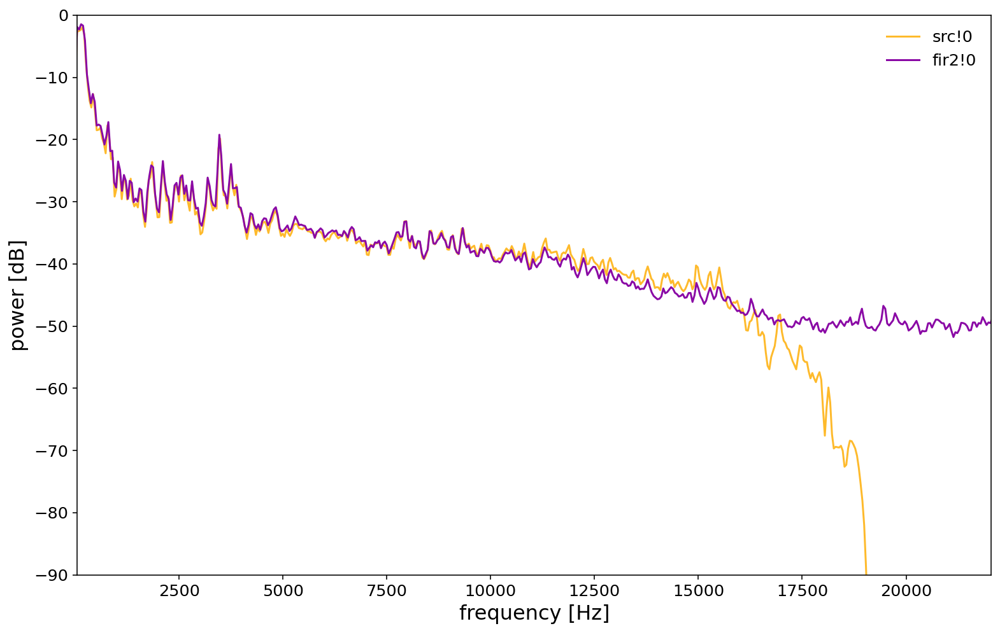

In [80]:
L1, M1 = 64, 63
L2, M2 = 15, 14
basic_simulation(G_casc_6415_int, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of integer, cascade, 64/63 then 15/14 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and is longer than the monolithic design.

    - This is consistent to the simulation results using block wave. 
    
- The shape of the resampled signal fits the origin audio, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that

- When the frequncy is less than around 16 *kHz*, the PSD of the origin audio are largely kept.

    - This demonstrates the correctness of this system. We can derive that the resampled audio will sound the same as the original one.

- But the power of frequencies higher than around 16 *kHz* are much more higher than before. 

    - This phenomenon is consistent to the behavior of `lanczos2(t)`. The negative coefficients introduce unexpected fluctuations and overflow, which enlarges the power of high frequencies. 

We can listen to the original and re-sampled audio. And there are actually no significant differences, which is consistent to the frequency domain comparison results, and proves the feasibility of this graph. **Additionally, in practical use, integer version will be the better choice**, since it costs lower resource and shorter computation time without noticeable loss of quality.

In [81]:
G.fir1.I[0].play_data()

src!0 : rate= 44.1kHz


In [82]:
G.snk.I[0].play_data()

fir2!0 : rate= 48.0kHz


### Simulation and verification on integer, cascades, 15/14 then 64/63, sophisticated version

src (MP3)         : build       : ../audio/sultans.mp3: 16b, 59s*44.1kHz
G_casc_1564_int (Graph): no errors


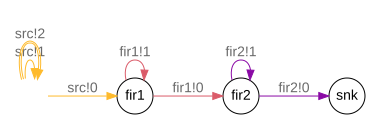

In [83]:
G_casc_1564_int = get_casc_1564_int(input='mp3')
G = G_casc_1564_int
G.build()
G.plot_graph()

 #cycles real time  cpu time   #events  SDF=Y    rate=48.0kHz
     400   8.333ms      0.2s      2312  lasso=3(320)*, real time
   74900     1.56s     10.2s    434878  
  151500     3.16s     20.2s    879638  
  228100     4.75s     30.2s   1324396  
  240000     5.00s     31.9s   1393494  pause (44ke/cs)

 Sample rate of G_casc_1564_int:	 input: 44.1 kHz 	 output: 48.0 kHz


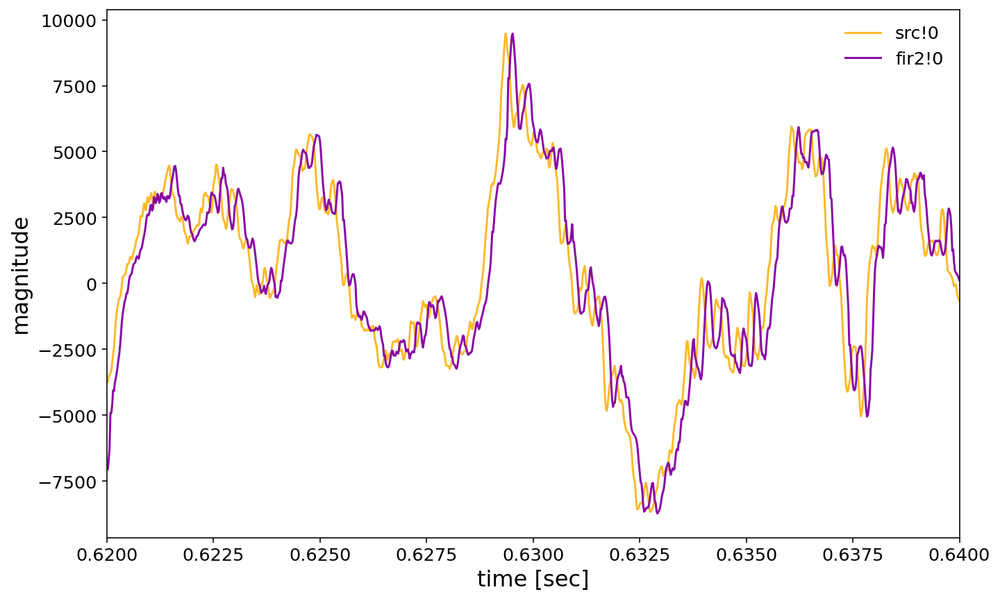

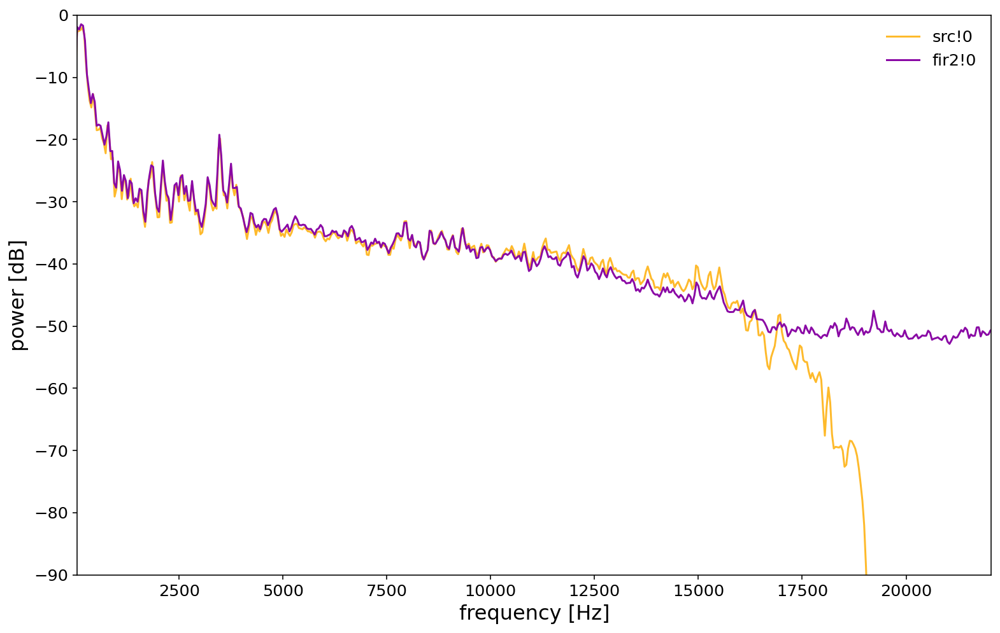

In [84]:
L1, M1 = 15, 14
L2, M2 = 64, 63
basic_simulation(G_casc_1564_int, cascade=True)

The time and frequency domain comparisons between the origin block wave and resampled wave of integer, cascade, 15/14 then 64/63 sophisticated version design.

First, we can see that the output rate is 48 *kHz*, which is consistent to the requirements.

From the time domain figure, we can observe that 

- latency exists, and is longer than the monolithic design.

    - This is consistent to the simulation results using block wave. 
    
- The shape of the resampled signal fits the origin audio, which illustrates the correctness of this graph.

With respect to the frequency domain, we can observe that

- When the frequncy is less than around 16 *kHz*, the PSD of the origin audio are largely kept.

    - This demonstrates the correctness of this system. We can derive that the resampled audio will sound the same as the original one.

- But the power of frequencies higher than around 16 *kHz* are much more higher than before. 

    - This phenomenon is consistent to the behavior of `lanczos2(t)`. The negative coefficients introduce unexpected fluctuations and overflow, which enlarges the power of high frequencies. 

We can listen to the original and re-sampled audio. And there are actually no significant differences, which is consistent to the frequency domain comparison results, and proves the feasibility of this graph. **Additionally, in practical use, integer version will be the better choice**, since it costs lower resource and shorter computation time without noticeable loss of quality.

In [85]:
G.fir1.I[0].play_data()

src!0 : rate= 44.1kHz


In [86]:
G.snk.I[0].play_data()

fir2!0 : rate= 48.0kHz


# Analysis
Address the performance and resource usage of your designs. See the guidelines notebook $\mathtt{~𝚐𝚞𝚒𝚍𝚎𝚕𝚒𝚗𝚎𝚜.𝚒𝚙𝚢𝚗𝚋~}$ for further instructions on what to report.

<center><font color=blue size="5">
Report your analysis here.
</font></center>

In this section, we will analyze these six graphs from throughputs, latency, memory, compute resources and utilization aspects.

## Throughputs

The rates of output signal generated by all graphs have been checked. The results are shown in Chapter 6, so we will not repeat here. All the graphs manage to obtain an output rate at 48 *kHz* given 44.1 *kHz* inputs, which demonstrate that all graphs satisfy the requirements mentioned in Chapter 5, the selected design choices are **all feasible**.

## Latency

From the simulation in Chapter 6, we observe that all monolithic design will achieve an shorter latency compared to cascade ones. In this section, we will perform an quantitative analysis. In the following code block, the latencies of all graphs are computed by get the time gap between the occurance of the corresponding input and output token within one period. With the help of `lasso` above, we have

- For monolithic designs (`lasso=2(160)*`), we can check 147-th input, and 160-th output
- For 64/63 then 15/14 designs (`lasso=3(480)*`), we can check 441-th input ($441 = 147*3$), and 480-th output ($480 = 160*3$)
- For 64/63 then 15/14 designs (`lasso=3(320)*`), we can check 441-th input ($294 = 147*2$), and 320-th output ($320 = 160*2$)

In [87]:
i_ind, o_ind = 147, 160
print('Latency of {0:s}:\t {1:3.5f} ms'.format(G_mono_float.name, 1000*(G_mono_float.fir.O[0].flow()[o_ind]-G_mono_float.fir.I[0].flow()[i_ind])))
print('Latency of {0:s}:\t\t {1:3.5f} ms'.format(G_mono_int.name, 1000*(G_mono_int.fir.O[0].flow()[o_ind]-G_mono_int.fir.I[0].flow()[i_ind])))
i_ind, o_ind = 441, 480
print('Latency of {0:s}:\t {1:3.5f} ms'.format(G_casc_6415_float.name, 1000*(G_casc_6415_float.fir2.O[0].flow()[o_ind]-G_casc_6415_float.fir1.I[0].flow()[i_ind])))
print('Latency of {0:s}:\t {1:3.5f} ms'.format(G_casc_6415_int.name, 1000*(G_casc_6415_int.fir2.O[0].flow()[o_ind]-G_casc_6415_int.fir1.I[0].flow()[i_ind])))
i_ind, o_ind = 294, 320
print('Latency of {0:s}:\t {1:3.5f} ms'.format(G_casc_1564_float.name, 1000*(G_casc_1564_float.fir2.O[0].flow()[o_ind]-G_casc_1564_float.fir1.I[0].flow()[i_ind])))
print('Latency of {0:s}:\t {1:3.5f} ms'.format(G_casc_1564_int.name, 1000*(G_casc_1564_int.fir2.O[0].flow()[o_ind]-G_casc_1564_int.fir1.I[0].flow()[i_ind])))

Latency of G_mono_float:	 0.02083 ms
Latency of G_mono_int:		 0.02083 ms
Latency of G_casc_6415_float:	 0.04167 ms
Latency of G_casc_6415_int:	 0.04167 ms
Latency of G_casc_1564_float:	 0.04167 ms
Latency of G_casc_1564_int:	 0.04167 ms


We can observe that there is no difference between integer and float versions. This is consistent to the designs, because data representations only affect the precision. Another finding is the latency of cascade designs are **twice as long as** the monolithic one, which is also reasonable to the designs, because in cascade designs, the signal will be processed twice. A more general deduction is for the same input and output rates, cascades designs consisted of $n$ components will be of $n$ times latency compared to the monolithic one.

## Memory

From the theoretical analysis before, it is obvious that all designs based on integers will cost less memories than float-based designs. And cascade versions use less coefficients (316 versus 640), so the best choice may be the integer-based cascade ones. Here we will conduct quantitative analysis.

In [88]:
def get_memory_summary(G):
    rscd = G.print_data(pretty=False)
    rscf = G.print_flow(pretty=False)
    rsc = pd.merge(rscf, rscd, left_index=True, right_index=True)
    rsc['D+S'] = rsc['D'] + rsc['S']
    return rsc

In [89]:
rsc = get_memory_summary(G_mono_float)
rsc[['D', 'S', 'D+S']].sum()

D      0
S      2
D+S    2
dtype: int64

In [90]:
rsc = get_memory_summary(G_mono_int)
rsc[['D', 'S', 'D+S']].sum()

D      0
S      2
D+S    2
dtype: int64

In [91]:
rsc = get_memory_summary(G_casc_6415_float)
rsc[['D', 'S', 'D+S']].sum()

D      0
S      3
D+S    3
dtype: int64

In [92]:
rsc = get_memory_summary(G_casc_6415_int)
rsc[['D', 'S', 'D+S']].sum()

D      0
S      3
D+S    3
dtype: int64

In [93]:
rsc = get_memory_summary(G_casc_1564_float)
rsc[['D', 'S', 'D+S']].sum()

D      0
S      3
D+S    3
dtype: int64

In [94]:
rsc = get_memory_summary(G_casc_1564_int)
rsc[['D', 'S', 'D+S']].sum()

D      0
S      3
D+S    3
dtype: int64

Note that above analysis only counts the memory usage on edges. We should also take the coeffients into account. Hence, we can use a table to represent the results. Note that each `int16` costs 2 bytes, and 4 bytes for `float32`. 

Index | Design                                                                           | Memory Usage
:---  | :---                                                                             | :---
1     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, float                  | <div style="width: 400pt"> 2568 bytes (642 float in total. 2 float on edge, 640 float coefficients)
2     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, int                    | <div style="width: 400pt"> 1284 bytes (642 int in total. 2 int on edge, 640 int coefficients)
3     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, float | <div style="width: 400pt"> 1276 bytes (319 float in total. 3 float on edge, 316 float coefficients)
4     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, int   | <div style="width: 400pt"> 638 bytes (319 int in total. 3 int on edge, 316 int coefficients)
5     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, float | <div style="width: 400pt"> 1276 bytes (319 float in total. 3 float on edge, 316 float coefficients)
6     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, int   | <div style="width: 400pt"> 638 bytes (319 int in total. 3 int on edge, 316 int coefficients)
    
These results are consistent to our theoretical analysis above. Due to less coefficients and space-saving data type, integer-based cascades designs are the best choice with respect to memory usage. Meanwhile, the bandwidth on the output and input edge are exactly the same, so there is no need to compare here.

## Compute resource of nodes

To count the compute resource of nodes, the `plot_circuit()` method provides the internal visualizations. In this way, we can check the number of adders and multipliers. Actually, there is only one node that needs to check. Because the representations of `node.fo()` in all the scaler nodes are the same, they shows different behavior only because of different parameters (*coefficients*, $L$ and $M$), and the number of adders and multipliers only depends on the `node.fo()` function. Also, quantizing to `int` is implemented by bit shifting in hardware, where there are no adders or multipliers needed. So checking one node suffices in this scenario.

fir        fo[0]      lambda x: sum([h[j*L+((x[1]*M)%L)]*x[0][4-j-1] for j in range(4)])
fir        fo[1]      lambda x: x[1]+1 if x[1] < (L-1) else 0
 


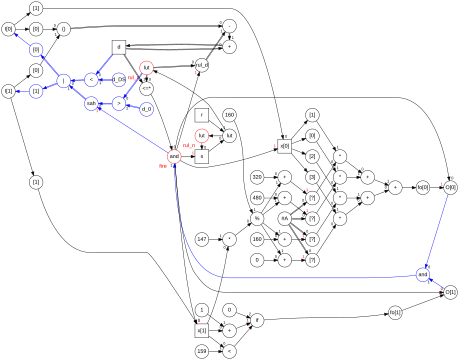

In [95]:
G_mono_float.fir.plot_circuit()  # 9 adders, 5 multipliers

From the figure provided by `plot_circuit()` method, there are 9 adders and 5 multipliers within one node, so the compute resource usage of graphs are

Index | Design                                                                           | Compute resource usage
:---  | :---                                                                             | :---
1     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, float                  | <div style="width: 350pt"> 9 adders, 5 multipliers
2     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, int                    | <div style="width: 350pt"> 9 adders, 5 multipliers
3     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, float | <div style="width: 350pt"> 18 adders, 10 multipliers
4     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, int   | <div style="width: 350pt"> 18 adders, 10 multipliers
5     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, float | <div style="width: 350pt"> 18 adders, 10 multipliers
6     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, int   | <div style="width: 350pt"> 18 adders, 10 multipliers
    
These results are consistent to our theoretical analysis above. Cascade designs cost more compute resource due to its two-stage scaling involving two nodes. So with respect to compute resource usage, monolithic designs are better.

## Utilization

The utilization, a.k.a. Hardware Utilization Efficiency (HUE) is defined as *the average number of firings per clock cycle* (from lecture note 7). For all graphs we consider, the utilizations are the same, it is

$$
\textit{HUE} = \frac{44.1 \textit{kHz}}{48 \textit{kHz}} = 91.875\%
$$

So utilization will not be a decisive metric in this case for choosing the best design.

# Conclusion

We can summarize all the (qualitative) decisive metrics that can affect design choices from all feasible designs into one table below. For the detailed observation, please refer to Chapter 6 and 7.

Index | Design                                                                           | Compute resource usage | Memory usage | Latency
:---  | :---                                                                             | :---                   | :---         | :---
1     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, float                  | low                    | 2568 bytes   | low
2     | <div style="width: 250pt"> monolithic, $\frac{160}{147}$, int                    | low                    | 1284 bytes   | low
3     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, float | high                   | 1276 bytes   | high
4     | <div style="width: 250pt"> cascades, $\frac{64}{63}$ then $\frac{15}{14}$, int   | high                   | 638 bytes    | high
5     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, float | high                   | 1276 bytes   | high
6     | <div style="width: 250pt"> cascades, $\frac{15}{14}$ then $\frac{64}{63}$, int   | high                   | 638 bytes    | high

Obviously, there is trade-off between compute resource and memory usage. According to the table, we can conclude that
    
- Since integer precision hardly affects the quality, **integer-based options should be taken into consideration first**.
- Monolithic designs can achieve low latency output and cost less compute resource. But it generally takes up more memory.
- Cascade designs suffer from longer latency and high compute resource overhead. But they consume less memory.
- The pros and cons of cascade designs will be simutaneously magnified as the number of components becomes larger.

Taking all these into consideration, the developers need to choose the best design according to the requirements and hardware parameters.

# Bibliography

<a id="1">[1]</a> https://en.wikipedia.org/wiki/Modular_arithmetic#Congruence

<a id="2">[2]</a> https://en.wikipedia.org/wiki/Modulo_operation#Performance_issues

<a id="3">[3]</a> https://en.wikipedia.org/wiki/Overshoot_(signal)

<a id="4">[4]</a> https://en.wikipedia.org/wiki/Affine_combination

<b>
<font color=green>
<center>
CONGATULATIONS, YOU HAVE FINISHED THE ASSIGNMENT. 
<br>
BEFORE SUBMITTING, CHECK YOUR ANSWERS CAREFULLY AND ENSURE THAT YOUR CODE DOES NOT BREAK!!!
</center>
</font>
</b>